# Import libraries

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
#Author: Sanjay Kottapalli, Dana Pe'er lab (kottapas@mskcc.org)

import numpy as np
import numpy.matlib
import pandas as pd
import scanpy as sc
from scanpy.external.pp import magic
import scipy
from sklearn.metrics import adjusted_rand_score
from scipy.stats.mstats import zscore
from scipy.stats import pearsonr
import csv
import os
import matplotlib
matplotlib.use('TkAgg')
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
from copy import deepcopy
import timeit
from joblib import Parallel, delayed
from collections import Counter
np.random.seed(0)

# Define functions

In [3]:
def import_seqc_data(sample_name, path, dense=True):
    print('\nsample: ' + sample_name)
    if dense:
        PATH_TO_COUNT_CSV = path + sample_name + '_dense.csv'
        # import csv
        raw_counts = pd.read_csv(PATH_TO_COUNT_CSV, index_col=0, header=0)
        print(raw_counts.shape)
        #
        with open(PATH_TO_COUNT_CSV, "r") as f:
            reader = csv.reader(f)
            original_column_names = next(reader)
        # remove the first entry of this list, it belongs to the index column
        gene_names = original_column_names[1:]
        # and label the index column with name 'cell_barcodes'
        raw_counts.index.name = 'cell_barcodes'
        # convert indices to strings instead of integers for compatibility with scanpy
        raw_counts.index = raw_counts.index.astype(str)
        # python automatically converts duplicate column names to numbered column names,
        # e.g. 'X', 'X.1', 'X.2' etc. We can import the original column names from our CSV file:

        # now transpose the dataframe (for compatibility with panda's groupby function), 
        # then group by gene names, and add up the counts for genes with the same name
        raw_counts_transposed = raw_counts.T
        raw_counts_transposed_clean = raw_counts_transposed.groupby(gene_names, axis='index', sort=False).agg('sum')
        # transpose back
        raw_counts_clean = raw_counts_transposed_clean.T
        # if columns were added up, print how many:
        number_of_columns_removed = raw_counts.shape[1] - raw_counts_clean.shape[1]
        if number_of_columns_removed > 0:
            print(str(number_of_columns_removed) + ' columns were each merged with another column that had the same gene name.')
        # remove CLUSTER column:
        if 'CLUSTER' in raw_counts_clean.columns:
            raw_counts_clean.drop(columns='CLUSTER', inplace=True)
        # convert index type to string for compatibility with scanpy
        raw_counts_clean.index = raw_counts_clean.index.astype('str')
        adata = sc.AnnData(X = raw_counts_clean)
    else:
        barcodes = pd.read_csv(path+sample_name+'_sparse_counts_barcodes.csv', index_col=0, header=None)
        barcodes = barcodes[1].values
        barcodes = [str(i) for i in barcodes]
        gene_names = pd.read_csv(path+sample_name+'_sparse_counts_genes.csv', index_col=0, header=None)
        gene_names = gene_names[1].values
        sparse_counts = scipy.io.mmread(path+sample_name+'_sparse_molecule_counts.mtx').tocsc()
        #print("# of bytes: "+str(sparse_counts.data.nbytes))
        print(sparse_counts.shape)
        #sparse_counts = sparse_counts.toarray()#np.array(sparse_counts)
        #print(sparse_counts.shape)
        #raw_counts = pd.DataFrame.sparse.from_spmatrix(data=sparse_counts, index=barcodes, columns=gene_names)
        
        gene_dup = pd.Series(dict(Counter(gene_names)))
        gene_dup = gene_dup[gene_dup>1]
        #print(gene_dup)
        #print(len(set(gene_names)))
        gene_dup = list(gene_dup.keys())
        number_of_columns_removed = len(gene_dup)
        
        # sum of duplicate columns for each duplicate gene
        sum_dict = {i:sparse_counts[:,np.where(gene_names==i)[0]].sum(axis=1) for i in gene_dup}
        dup_index = []
        for i in gene_dup:
            dup_index += list(np.where(gene_names==i)[0])
        #print(sum_dict)
        #print(len(dup_index))
        #for i in sum_dict:
        #    print(sum_dict[i].sum(axis=0))
        
        #print(len(gene_names), sparse_counts.shape)
        keep_index = list(set(range(len(gene_names))) - set(dup_index))
        new_genes = list(gene_names[keep_index])
        new_counts = sparse_counts[:, keep_index]
        #print(len(new_genes), new_counts.shape)
        #print(new_counts.shape, type(new_counts))
        for i in sum_dict.keys():
            #print(sum_dict[i])
            #print(type(new_counts), type(sum_dict[i]))
            new_counts = scipy.sparse.hstack([new_counts, sum_dict[i]])
            new_genes.append(i)
        #print(len(new_genes), new_counts.shape)
        new_counts = new_counts.tocsc()
        print(new_counts.shape)#, type(new_counts))
        
        adata = sc.AnnData(X = new_counts, obs=pd.DataFrame(index=barcodes), var=pd.DataFrame(index=new_genes))
        
        if number_of_columns_removed > 0:
            print(str(number_of_columns_removed) + ' columns were each merged with another column that had the same gene name.')
       # take the min libsize in the dense cells, and 
        
        adata, mito_genes, RB_genes_in_data = qc_metrics(adata)
        # remove high mito frac cells
        cutoff = 20.0
        mito_val = adata.obs['pct_counts_mito']
        #print(mito_val)
        via_cells = mito_val[mito_val<cutoff]
        #print(via_cells)
        adata = adata[via_cells.index, :]
        print(adata.shape)
        
        PATH_TO_COUNT_CSV = path + sample_name + '_dense.csv'
        raw_counts = pd.read_csv(PATH_TO_COUNT_CSV, index_col=0, header=0)
        seqc_cells = [str(i) for i in raw_counts.index]
        libsize = adata.obs['original_total_counts'].sort_values(ascending=False)
        #pd.Series(index=adata.obs.index, data=np.array(np.sum(adata.X, axis=1).flatten())[0], dtype=str).sort_values(ascending=False)
        
        #difference = set(seqc_cells)-set([str(i) for i in libsize.iloc[:len(seqc_cells)+15000].index])
        #print(len(seqc_cells),len(difference))
        #print(seqc_cells[:20])
        #print(libsize.iloc[:20])
        
        adata = adata[libsize.iloc[:len(seqc_cells)+15000].index, :] # all dense cells + 15,000
        adata = sc.AnnData(X = adata.X, obs=pd.DataFrame(index=adata.obs.index), var=pd.DataFrame(index=adata.var.index))
        print(adata.shape)
        print("Cells filtered.")
    
    return adata

In [4]:
def qc_metrics(adata, path_RB=''):
    mito_genes = adata.var_names.str.startswith('MT-')
    adata.var['mito'] = mito_genes
    mito_genes = np.array(adata.var.index)[mito_genes]
    
    path_RB = path_RB+'RB_genes_human'
    with open(path_RB,'r') as file:
        lines = file.readlines()
    RB_genes = [x.rstrip('\n') for x in lines]
    data_genes = list(adata.var.index)
    RB_genes_in_data = set(data_genes).intersection(RB_genes)
    RB_genes_in_data = list(RB_genes_in_data)
    
    adata.var['ribo'] = False
    adata.var.loc[RB_genes_in_data, 'ribo'] = True
    
    sc.pp.calculate_qc_metrics(adata, qc_vars=('mito', 'ribo'), inplace=True)
    adata.obs['original_total_counts'] = adata.obs['total_counts']
    adata.obs['log10_original_total_counts'] = np.log10(adata.obs['original_total_counts'])
    print('QC metrics calculated.')
    
    return adata, mito_genes, RB_genes_in_data

In [5]:
def norm_filter(adata, mito_genes, RB_genes_in_data, log=True, remove_ribo=True, remove_mito=True, highly_var=False, markers=[]):
    
    adata.layers['raw_counts'] = adata.X
    # filter genes expressed in few cells
    print(adata.shape)
    sc.pp.filter_genes(adata, min_cells = 10)
    print(adata.shape)
    
    # libsize normalize
    if type(adata.X)==np.ndarray:
        med_libsize = np.median(np.sum(adata.X, axis=1))
    else:
        sums = np.array(np.sum(adata.X, axis=1).flatten())[0]
        #med_libsize = np.median(sums)
        if min(sums) == 0:
            empty_cells = set(np.where(sums==0)[0])
            print('# of 0-count droplets: '+str(len(empty_cells)))
            all_cells = set(adata.obs.index)
            keep_cells = all_cells-empty_cells
            adata = adata[keep_cells, :]
            sums = np.array(np.sum(adata.X, axis=1).flatten())[0]
        med_libsize = np.median(sums)

        print('Median library size: ' + str(med_libsize))

    sc.pp.normalize_total(adata)

    # log transform
    if log:
        adata.X = np.log2(adata.X+0.1) - np.log2(0.1)

        for i in deepcopy(markers):
            try:
                adata.obs[i+'_exp'] = adata[:,i].X
            except:
                markers.remove(i)
                print(i)

    else:
        for i in deepcopy(markers):
            try:
                adata.obs[i+'_exp'] = np.log2(adata[:,i].X+0.1)
            except:
                markers.remove(i)
                print(i)

    # remove ribosomal genes
    if remove_ribo:
        RB_genes_in_data.append('MALAT1')
        adata = adata[:,[x not in RB_genes_in_data for x in adata.var.index]]
        print(adata.shape)

    # remove mitochondrial genes
    if remove_mito:
        adata = adata[:,[x not in mito_genes for x in adata.var.index]]
        print(adata.shape)

    # highly variable gene selection
    print(highly_var)
    if highly_var:
        if not log:
            print('Im here1')
            sc.pp.highly_variable_genes(adata, layer='raw_counts', flavor='seurat_v3',max_mean=np.inf, n_top_genes=2000)#, batch_key='Sample ID')
            print(sum(adata.var['highly_variable']))
            adata.var.loc[markers, 'highly_variable'] = True
            print(sum(adata.var['highly_variable']))
            print(adata.shape)
        elif log:
            print('Im here2')
            sc.pp.highly_variable_genes(adata, layer=None, flavor='cell_ranger', max_mean=np.inf, n_top_genes=2000)#, batch_key='Sample ID')
            print(sum(adata.var['highly_variable']))
            adata.var.loc[markers, 'highly_variable'] = True
            print(sum(adata.var['highly_variable']))

    return adata, markers#adata_unlog, markers

In [6]:
def plot_pca(adata):
    #print("I am in here 1")
    
    print(adata.X)
    try:
        print(adata.shape)
        N = 1000
        adata_new = sc.tl.pca(adata, n_comps=N, copy = True)
    except:
        print(adata.shape) 
        N = min(adata.shape) - 1
        adata_new = sc.tl.pca(adata, n_comps=N, copy = True)
    
    #Plot variance explained
    x = range(len(adata_new.uns['pca']['variance_ratio']))
    y = adata_new.uns['pca']['variance_ratio']
    plt.scatter(x,y,s=4)
    plt.xlabel('PC')
    plt.ylabel('Fraction of variance explained')
    plt.title('Fraction of variance explained per PC')
    plt.show()
    
    #Plot cumulative variance
    cml_var_explained = np.cumsum(adata_new.uns['pca']['variance_ratio'])
    x = range(len(adata_new.uns['pca']['variance_ratio']))
    y = cml_var_explained
    plt.scatter(x,y,s=4)
    plt.xlabel('PC')
    plt.ylabel('Cumulative fraction of variance explained')
    plt.title('Cumulative fraction of variance explained by PCs')
    plt.show()
    
    return cml_var_explained, adata_new.uns['pca']['variance_ratio']
    
def kneepoint(vec):
    #print("I am in here 4")
    curve =  [1-x for x in vec]
    nPoints = len(curve)
    allCoord = np.vstack((range(nPoints), curve)).T
    np.array([range(nPoints), curve])
    firstPoint = allCoord[0]
    lineVec = allCoord[-1] - allCoord[0]
    lineVecNorm = lineVec / np.sqrt(np.sum(lineVec**2))
    vecFromFirst = allCoord - firstPoint
    scalarProduct = np.sum(vecFromFirst * numpy.matlib.repmat(lineVecNorm, nPoints, 1), axis=1)
    vecFromFirstParallel = np.outer(scalarProduct, lineVecNorm)
    vecToLine = vecFromFirst - vecFromFirstParallel
    distToLine = np.sqrt(np.sum(vecToLine ** 2, axis=1))
    idxOfBestPoint = np.argmax(distToLine)
    
    return idxOfBestPoint
    
def run_pca_knee(adata):
    cml, var = plot_pca(adata)

    knee = kneepoint(var)
    
    print("Knee point: "+str(knee))
    print("Explained variance: " + str(cml[knee]))

    x=list(range(len(cml)))
    plt.plot(x[:5*knee],cml[:5*knee])
    plt.show()

    adata_new = sc.tl.pca(adata, n_comps=knee+1, copy=True)
    sc.pl.pca_loadings(adata_new, components=range(1,4))
    
    return adata_new

In [7]:
def files_MAST(adata, cell_type = '', outdir = ''):
    
    # if directory doesn't exist, create it
    if not os.path.exists('DEA/' + cell_type):
        os.makedirs('DEA/' + cell_type)
    
    adata_celltype = deepcopy(adata)
    #adata_celltype = adata_celltype[adata_celltype.obs['final_subclusters'].isin([cell_type]),:]
    print(cell_type + '\t'+"Dimensions" + "\t"+ "{}".format(adata_celltype.shape))
    
    # make a dataframe for the expression matrix
    expmat = pd.DataFrame(adata_celltype.X, columns = adata_celltype.var.index, index = adata_celltype.obs.index)

    # make a dataframe for the observation data
    cdata = pd.DataFrame(adata_celltype.obs, columns=adata_celltype.obs.columns, index = adata_celltype.obs.index)

    
    expmat.to_csv(r'DEA/'+ cell_type + '/adata_'+ cell_type+ '_exp_mat.csv', index=True)
    cdata.to_csv(r'DEA/'+ cell_type + '/adata_'+ cell_type+ '_cdata.csv', index=True)
    
    print("Files written for {}".format(cell_type))

In [8]:
def run_MAST_for_celltype(adata, cell_type):
    start_time = timeit.default_timer()
    MAST = './runMAST.R'
    
    # run 
    files_MAST(adata = adata, cell_type = cell_type)
    
    expmat_Inputfile = ('DEA/'+ cell_type + '/adata_'+ cell_type+ '_exp_mat.csv')
    cdata_Inputfile = ('DEA/'+ cell_type + '/adata_'+ cell_type+ '_cdata.csv')
    output_file_cort = 'DEA/' +  cell_type + "/MAST_DEA_" + cell_type + "_cort.csv" 
    output_file_bs = 'DEA/' +  cell_type + "/MAST_DEA_" + cell_type + "_bs.csv" 
    
    print("Running " + MAST + " " + expmat_Inputfile + " " + cdata_Inputfile + " " + output_file_cort + " " + output_file_bs)
    
    os.system(MAST + " " + expmat_Inputfile + " " + cdata_Inputfile + " " + output_file_cort + " " + output_file_bs)
    out_str = "Finished running MAST on"+ "( " + cell_type +  ")" +" in {} seconds.".format(timeit.default_timer()-start_time)
    
    return out_str

In [9]:
godsnot_64 = [
    # "#000000",  # remove the black, as often, we have black colored annotation
    "#d9d929", "#1CE6FF", "#FF34FF", "#FF4A46", "#008941", "#006FA6", "#A30059",
    "#FFDBE5", "#7A4900", "#0000A6", "#63FFAC", "#B79762", "#004D43", "#8FB0FF", "#997D87",
    "#5A0007", "#809693", "#6A3A4C", "#1B4400", "#4FC601", "#3B5DFF", "#4A3B53", "#FF2F80",
    "#61615A", "#BA0900", "#6B7900", "#00C2A0", "#FFAA92", "#FF90C9", "#B903AA", "#D16100",
    "#DDEFFF", "#000035", "#7B4F4B", "#A1C299", "#300018", "#0AA6D8", "#013349", "#00846F",
    "#372101", "#FFB500", "#C2FFED", "#A079BF", "#CC0744", "#C0B9B2", "#C2FF99", "#001E09",
    "#00489C", "#6F0062", "#0CBD66", "#EEC3FF", "#456D75", "#B77B68", "#7A87A1", "#788D66",
    "#885578", "#FAD09F", "#FF8A9A", "#D157A0", "#BEC459", "#456648", "#0086ED", "#886F4C",
    "#34362D", "#B4A8BD", "#00A6AA", "#452C2C", "#636375", "#A3C8C9", "#FF913F", "#938A81",
    "#575329", "#00FECF", "#B05B6F", "#8CD0FF", "#3B9700", "#04F757", "#C8A1A1", "#1E6E00",
    "#7900D7", "#A77500", "#6367A9", "#A05837", "#6B002C", "#772600", "#D790FF", "#9B9700",
    "#549E79", "#FFF69F", "#201625", "#72418F", "#BC23FF", "#99ADC0", "#3A2465", "#922329",
    "#5B4534", "#FDE8DC", "#404E55", "#0089A3", "#CB7E98", "#A4E804", "#324E72"]

# Populate input parameters

In [10]:
# populate from command line
samples = ['1819_C1029_Ctrl_ES_Cort_IGO_10837_23', '1820_C1029_Ctrl_ES_BS_IGO_10856_3', '1821_996_VE_ES_Cort_IGO_10875_6', '1822_996_VE_ES_BS_IGO_10875_7']
indir = './input/'
outdir = './output_Nov/'
figures = './figures/'

In [11]:
adata_final_high_var = sc.read_h5ad(outdir+'adata_final_high_var_final_clusters_updated.h5ad')

In [13]:
adata_final_high_var.shape

(23060, 18947)

# Oligodendrocyte subset

In [14]:
adata_oligo = deepcopy(adata_final_high_var)
adata_oligo = adata_oligo[adata_oligo.obs['final_subclusters'].isin(['Oligodendrocytes']),:]
adata_oligo.shape

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


(4804, 18947)

In [15]:
broad_clusters = adata_oligo.obs['Condition']
unique_clusters = np.unique(broad_clusters.values)
samples = adata_oligo.obs['Sample ID']
print('Cell counts in each cluster for each sample: ')

for cluster in unique_clusters:
    print('Cluster: '+str(cluster))
    index = broad_clusters[broad_clusters==cluster].index
    count = Counter(samples[index].values)
    print(count)

Cell counts in each cluster for each sample: 
Cluster: Control
Counter({'1820_C1029_Ctrl_ES_BS_IGO_10856_3': 1380, '1819_C1029_Ctrl_ES_Cort_IGO_10837_23': 363})
Cluster: VE
Counter({'1822_996_VE_ES_BS_IGO_10875_7': 2752, '1821_996_VE_ES_Cort_IGO_10875_6': 309})


In [16]:
path_to_h5ad_file = outdir+'adata.h5ad'
adata = sc.read_h5ad(path_to_h5ad_file)
print(adata)
# Add a new column describing the sample condition
adata.obs['Condition'] = np.where(adata.obs['Sample ID'] == '1819_C1029_Ctrl_ES_Cort_IGO_10837_23', "Control", "NA")
adata.obs['Condition'] = np.where(adata.obs['Sample ID'] == '1820_C1029_Ctrl_ES_BS_IGO_10856_3', "Control", adata.obs['Condition'])
adata.obs['Condition'] = np.where(adata.obs['Sample ID'] == '1821_996_VE_ES_Cort_IGO_10875_6', "VE", adata.obs['Condition'])
adata.obs['Condition'] = np.where(adata.obs['Sample ID'] == '1822_996_VE_ES_BS_IGO_10875_7', "VE", adata.obs['Condition'])


adata.obs.head()

AnnData object with n_obs × n_vars = 26101 × 22292
    obs: 'Sample ID'


,Sample ID,Condition
cell_barcodes,,
120703436570020_1819_C1029_Ctrl_ES_Cort_IGO_10837_23,1819_C1029_Ctrl_ES_Cort_IGO_10837_23,Control
120703455227244_1819_C1029_Ctrl_ES_Cort_IGO_10837_23,1819_C1029_Ctrl_ES_Cort_IGO_10837_23,Control
120703455251884_1819_C1029_Ctrl_ES_Cort_IGO_10837_23,1819_C1029_Ctrl_ES_Cort_IGO_10837_23,Control
120703455704877_1819_C1029_Ctrl_ES_Cort_IGO_10837_23,1819_C1029_Ctrl_ES_Cort_IGO_10837_23,Control
120718441244516_1819_C1029_Ctrl_ES_Cort_IGO_10837_23,1819_C1029_Ctrl_ES_Cort_IGO_10837_23,Control


In [17]:
# Add a new column describing the sample condition
adata.obs['B_region'] = np.where(adata.obs['Sample ID'] == '1819_C1029_Ctrl_ES_Cort_IGO_10837_23', "Cortex", "NA")
adata.obs['B_region'] = np.where(adata.obs['Sample ID'] == '1820_C1029_Ctrl_ES_BS_IGO_10856_3', "BrainStem", adata.obs['B_region'])
adata.obs['B_region'] = np.where(adata.obs['Sample ID'] == '1821_996_VE_ES_Cort_IGO_10875_6', "Cortex", adata.obs['B_region'])
adata.obs['B_region'] = np.where(adata.obs['Sample ID'] == '1822_996_VE_ES_BS_IGO_10875_7', "BrainStem", adata.obs['B_region'])


#adata.obs
# count the number of NAs
sum(pd.isna(adata.obs['B_region']))

0

In [18]:
adata_oligo = adata[adata_oligo.obs.index, :]
adata_oligo.shape

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


(4804, 22292)

## QC

In [19]:
adata_oligo, mito_genes, RB_genes_in_data = qc_metrics(adata_oligo)
markers = []
if type(adata_oligo.X)==np.ndarray:
    pass
else:
    print(type(adata_oligo.X))
    #print(adata_norm.X.shape)
    adata_oligo.X = adata_oligo.X.toarray()
    #print(adata_norm.X.shape)
adata_oligo.X = pd.DataFrame(data=adata_oligo.X).fillna(0).values

Trying to set attribute `.var` of view, copying.


QC metrics calculated.
<class 'scipy.sparse.csr.csr_matrix'>


In [20]:
adata_oligo.shape

(4804, 22292)

## Normalization

In [21]:
markers = []
adata_oligo, markers = norm_filter(adata_oligo, mito_genes, RB_genes_in_data, markers=[], highly_var=True)
adata_oligo.obs.head()

(4804, 22292)


/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


(4804, 13657)
(4804, 13479)
(4804, 13466)
True
Im here2


Trying to set attribute `.uns` of view, copying.


1999
1999


,Sample ID,Condition,B_region,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mito,log1p_total_counts_mito,pct_counts_mito,total_counts_ribo,log1p_total_counts_ribo,pct_counts_ribo,original_total_counts,log10_original_total_counts
cell_barcodes,,,,,,,,,,,,,,,,,,,
122490832730908_1822_996_VE_ES_BS_IGO_10875_7,1822_996_VE_ES_BS_IGO_10875_7,VE,BrainStem,1396,7.242082,2602.0,7.864420,24.673328,33.282091,45.234435,65.564950,9.0,2.302585,0.345888,21.0,3.091043,0.807071,2602.0,3.415307
192729653894382_1822_996_VE_ES_BS_IGO_10875_7,1822_996_VE_ES_BS_IGO_10875_7,VE,BrainStem,901,6.804615,1363.0,7.218177,22.743947,32.208364,46.881878,70.579604,11.0,2.484907,0.807043,18.0,2.944439,1.320616,1363.0,3.134496
126889101519772_1820_C1029_Ctrl_ES_BS_IGO_10856_3,1820_C1029_Ctrl_ES_BS_IGO_10856_3,Control,BrainStem,1276,7.152269,2550.0,7.844241,28.627451,37.921569,50.196078,69.568627,10.0,2.397895,0.392157,19.0,2.995732,0.745098,2550.0,3.406540
204882352170859_1820_C1029_Ctrl_ES_BS_IGO_10856_3,1820_C1029_Ctrl_ES_BS_IGO_10856_3,Control,BrainStem,1200,7.090910,2198.0,7.695758,27.479527,36.260237,47.497725,68.152866,5.0,1.791759,0.227480,17.0,2.890372,0.773430,2198.0,3.342028
121416400693035_1820_C1029_Ctrl_ES_BS_IGO_10856_3,1820_C1029_Ctrl_ES_BS_IGO_10856_3,Control,BrainStem,1089,6.993933,1855.0,7.526179,24.905660,33.962264,46.684636,68.247978,15.0,2.772589,0.808625,24.0,3.218876,1.293801,1855.0,3.268344


## PCA

[[0.        0.        0.        ... 0.        0.        0.       ]
 [0.        0.        0.        ... 0.        0.        0.       ]
 [3.0037491 0.        0.        ... 0.        0.        0.       ]
 ...
 [2.4583097 0.        0.        ... 0.        0.        0.       ]
 [0.        0.        0.        ... 0.        0.        0.       ]
 [0.        0.        0.        ... 0.        0.        0.       ]]
(4804, 13466)


/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


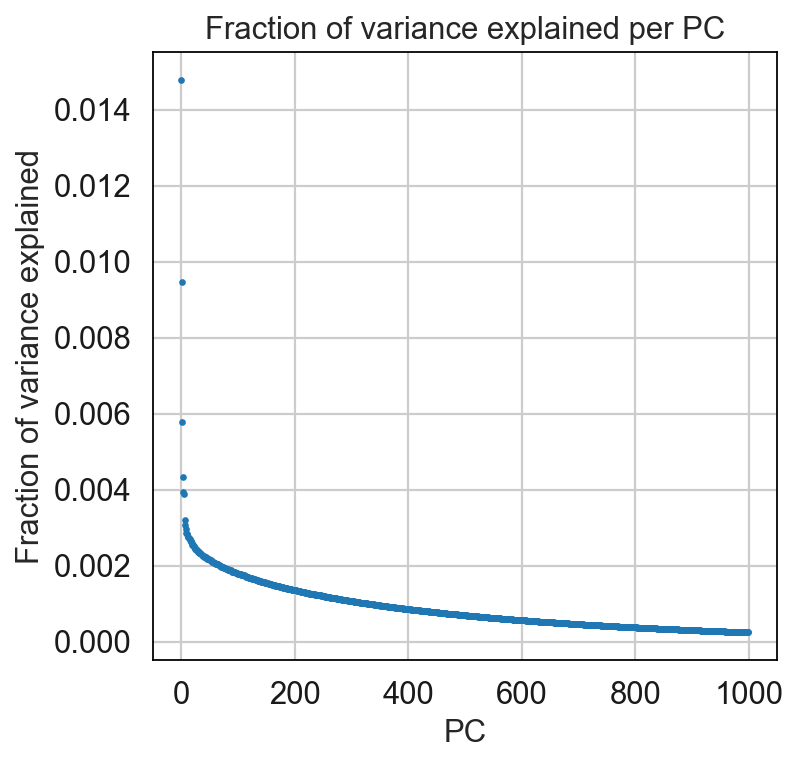

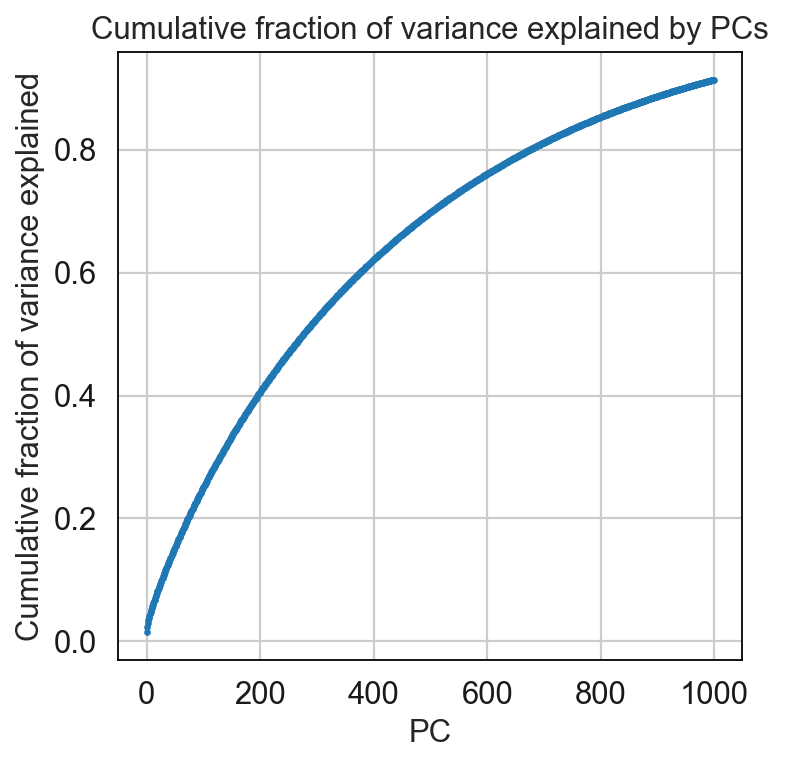

Knee point: 29
Explained variance: 0.10602518


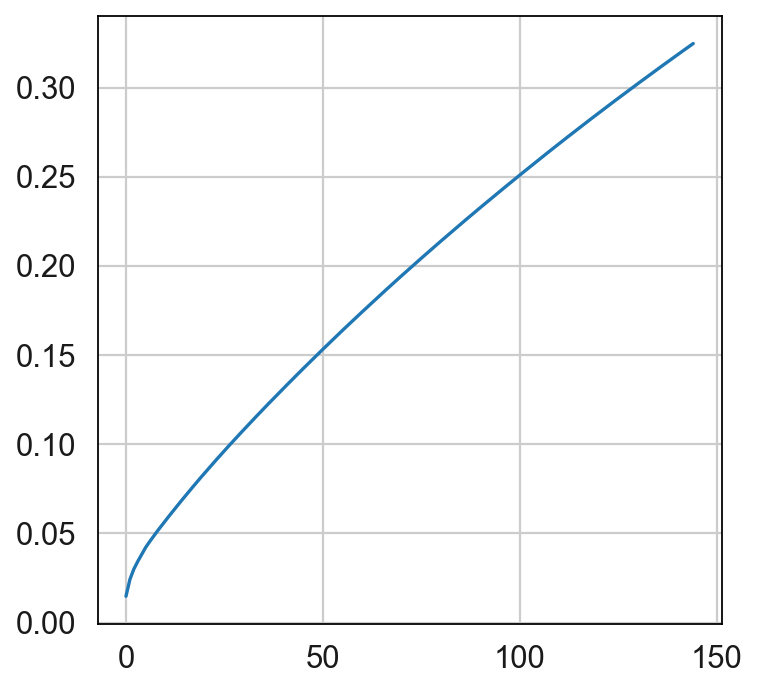

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:238: RuntimeWarning: Glyph 8942 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:201: RuntimeWarning: Glyph 8942 missing from current font.
  font.set_text(s, 0, flags=flags)


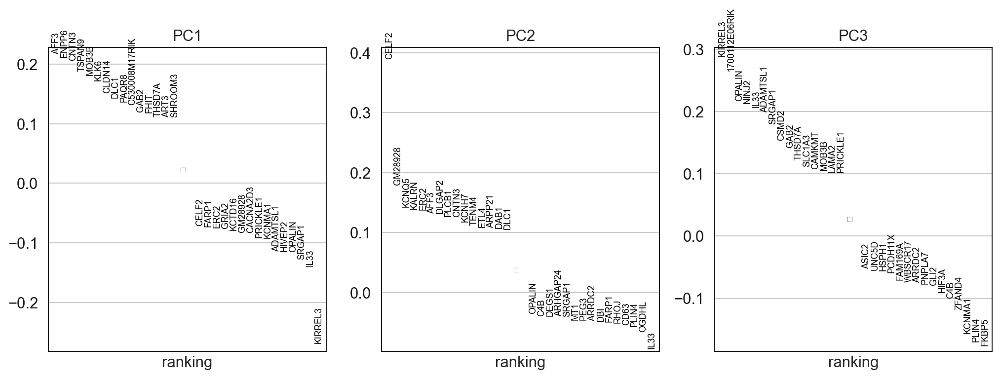

(4804, 13466)


/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [22]:
sc.set_figure_params(figsize=(5, 5))
adata_oligo = run_pca_knee(adata_oligo)#, 0.5)
adata_oligo.obs['PC 1'] = adata_oligo.obsm['X_pca'][:,0] # optional
adata_oligo.obs['PC 2'] = adata_oligo.obsm['X_pca'][:,1]
adata_oligo.obs['PC 3'] = adata_oligo.obsm['X_pca'][:,2]

print(adata_oligo.shape)
adata_oligo.X = pd.DataFrame(adata_oligo.X).fillna(0).values
index_list = np.arange(adata_oligo.shape[0])
np.random.shuffle(index_list)
adata_oligo = adata_oligo[index_list,:]

In [23]:
print(adata_oligo.shape)
adata_oligo.X = pd.DataFrame(adata_oligo.X).fillna(0).values
index_list = np.arange(adata_oligo.shape[0])
np.random.shuffle(index_list)
adata_oligo = adata_oligo[index_list,:]

(4804, 13466)


## Phenograph

Finding 10 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.4860858917236328 seconds
Jaccard graph constructed in 1.457651138305664 seconds
Wrote graph to binary file in 0.20137715339660645 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.705451
After 2 runs, maximum modularity is Q = 0.70832
After 19 runs, maximum modularity is Q = 0.710055
Louvain completed 39 runs in 1.9112780094146729 seconds
Sorting communities by size, please wait ...
PhenoGraph complete in 4.738327980041504 seconds


Trying to set attribute `.obs` of view, copying.


Finding 15 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.44306182861328125 seconds
Jaccard graph constructed in 0.8914749622344971 seconds
Wrote graph to binary file in 0.1879270076751709 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.647841
Louvain completed 21 runs in 1.3944098949432373 seconds
Sorting communities by size, please wait ...
PhenoGraph complete in 3.578166961669922 seconds
Finding 20 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.40418505668640137 seconds
Jaccard graph constructed in 1.1341710090637207 seconds
Wrote graph to binary file in 0.2653341293334961 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.622473
After 9 runs, maximum modularity is Q = 0.624484
After 11 runs, maximum modularity is Q = 0.628549
Louvain completed 31 runs in 2.73748779296875 seconds
Sorting communities by size, please wait ...
Ph

Text(0.5, 0, 'k')

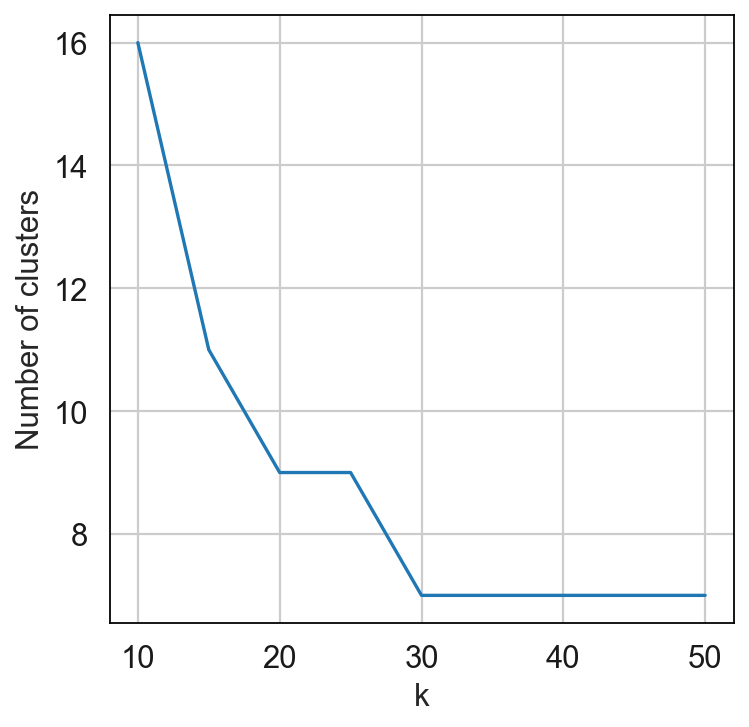

In [24]:
k_list = list(range(10, 55, 5))
n_clusters = []
for k in k_list:
    communities, graph, Q = sc.external.tl.phenograph(pd.DataFrame(adata_oligo.obsm['X_pca']),k=k)
    n_clusters.append(len(np.unique(communities)))
    adata_oligo.obs['PhenoGraph_clusters_oligo'+str(k)] = pd.Categorical(communities)
    adata_oligo.uns['PhenoGraph_Q_'+str(k)] = Q
    adata_oligo.uns['PhenoGraph_k_'+str(k)] = k
plt.plot(k_list,n_clusters)
plt.ylabel("Number of clusters")
plt.xlabel("k")

In [25]:
Rand_index_df = pd.DataFrame(np.zeros((len(k_list), len(k_list))),index=k_list,columns=k_list)
Rand_index_df.index.name='k1'
Rand_index_df.columns.name='k2'
row_ind = 0
for run1 in range(len(k_list)):
    col_ind = 0
    for run2 in range(len(k_list)):
        Rand_index_df.iloc[row_ind,col_ind] = adjusted_rand_score(
            adata_oligo.obs['PhenoGraph_clusters_oligo'+str(k_list[run1])].values,
            adata_oligo.obs['PhenoGraph_clusters_oligo'+str(k_list[run2])].values)
        col_ind = col_ind+1
    row_ind = row_ind+1
    

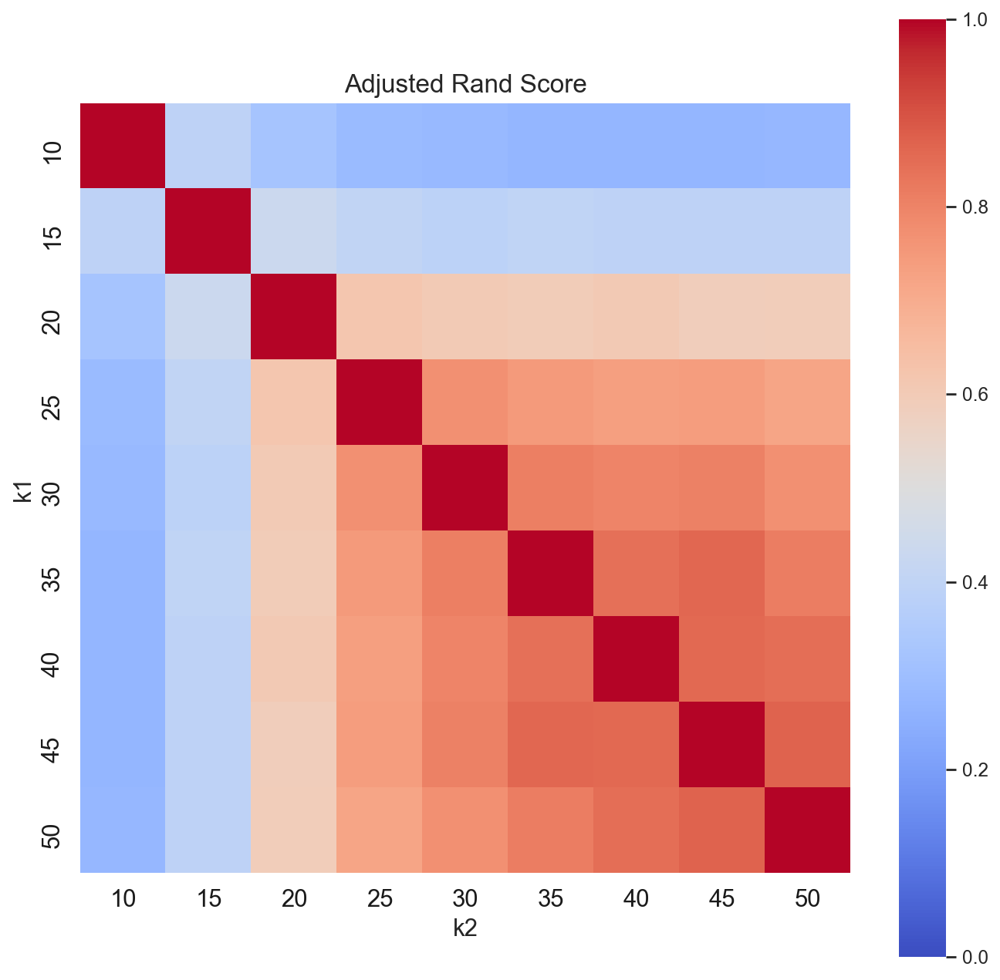

In [26]:
Rand_fig = plt.figure(figsize = (10,10))
plt.xlabel('k1')
plt.ylabel('k2')
plt.title('Adjusted Rand Score',fontsize=15)
sns.set(font_scale=1)
sns.heatmap(Rand_index_df, cmap=('coolwarm'), square=True, vmin=0, vmax=1)
# plt.colorbar(vmin=0)
plt.show();plt.close()


In [30]:
k = 30 # choose k
communities, graph, Q = sc.external.tl.phenograph(pd.DataFrame(adata_oligo.obsm['X_pca']),k=k) # run PhenoGraph
adata_oligo.obs['PhenoGraph_clusters_oligo'] = pd.Categorical(communities)
adata_oligo.uns['PhenoGraph_Q'] = Q
adata_oligo.uns['PhenoGraph_k'] = k

Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.49276208877563477 seconds
Jaccard graph constructed in 1.2138559818267822 seconds
Wrote graph to binary file in 0.4071178436279297 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.609401
After 3 runs, maximum modularity is Q = 0.614837
After 19 runs, maximum modularity is Q = 0.61584
After 23 runs, maximum modularity is Q = 0.617209
Louvain completed 43 runs in 4.143227815628052 seconds
Sorting communities by size, please wait ...
PhenoGraph complete in 6.920257091522217 seconds


## Vizualize Oligo sub-clusters

In [31]:
sc.set_figure_params(figsize=(8, 8))
sc.pp.neighbors(adata_oligo, method='umap', use_rep='X_pca')
sc.tl.umap(adata_oligo, random_state=None)

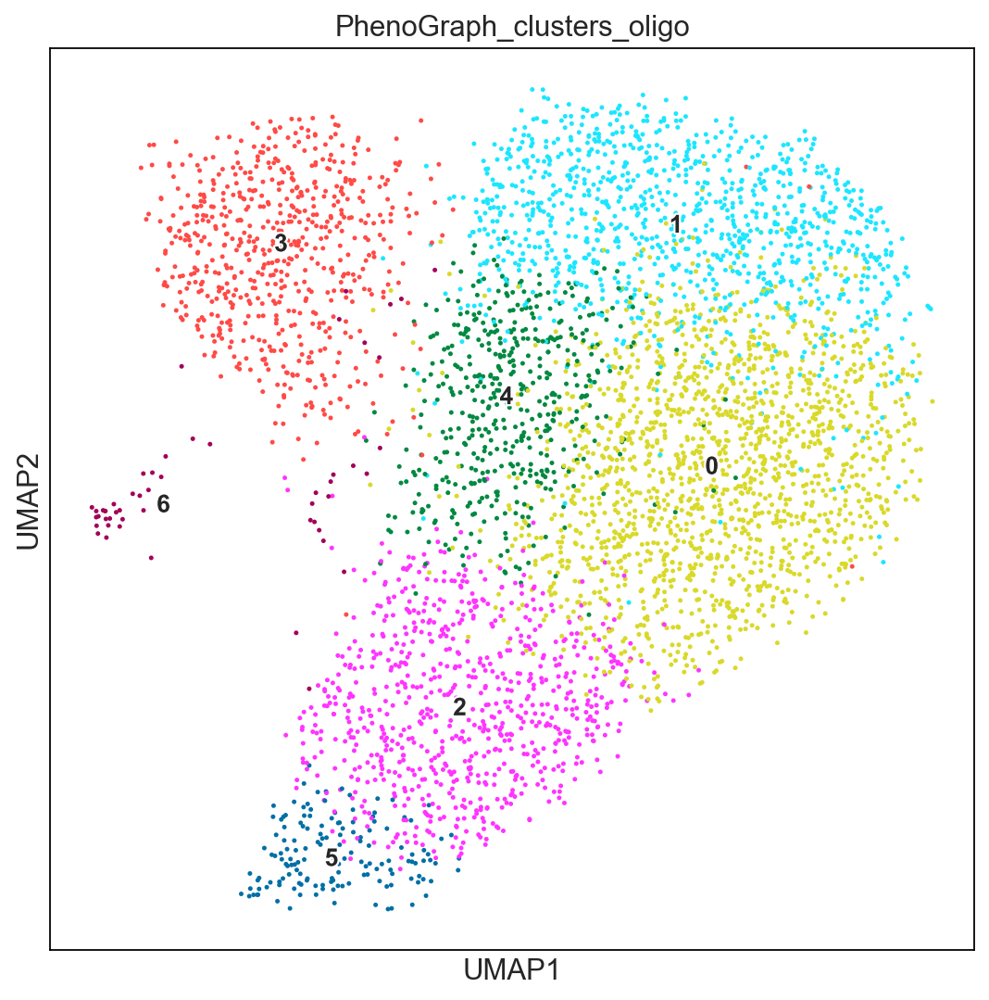

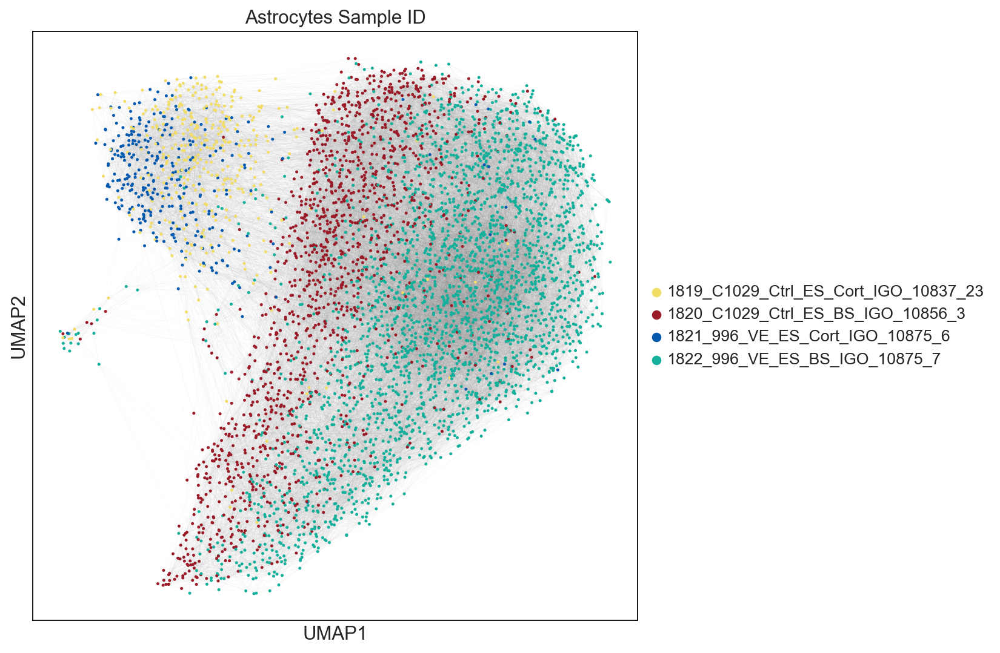

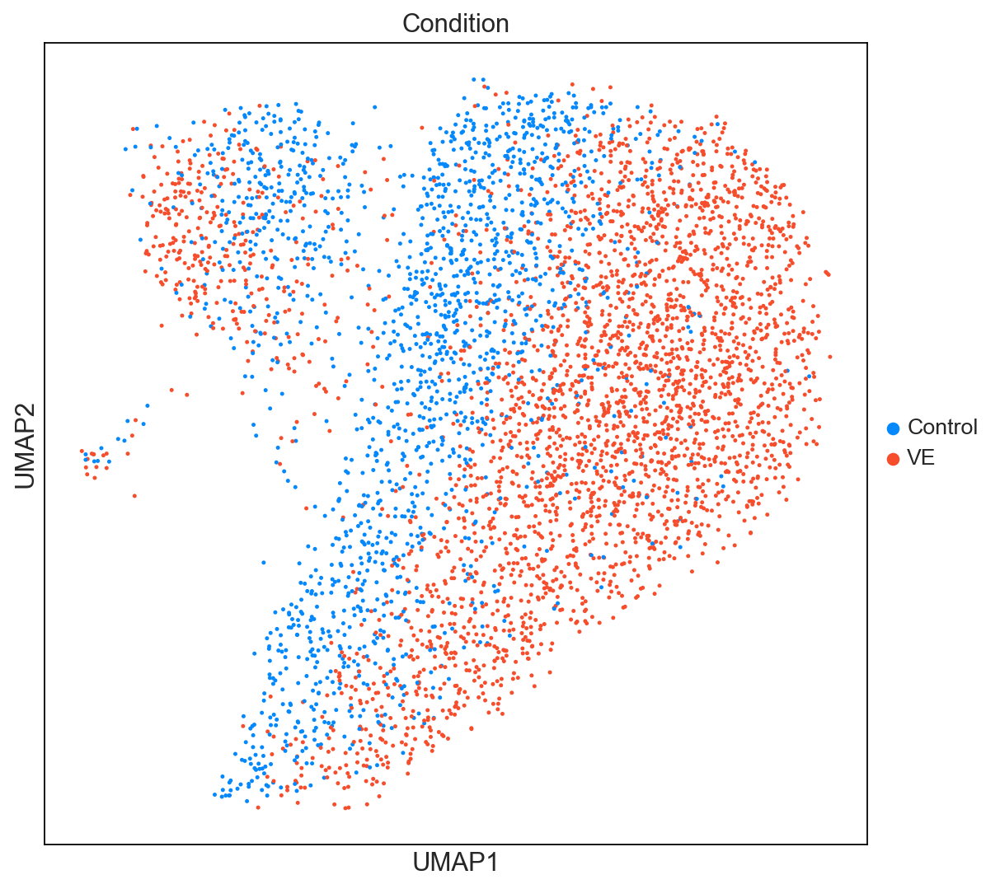

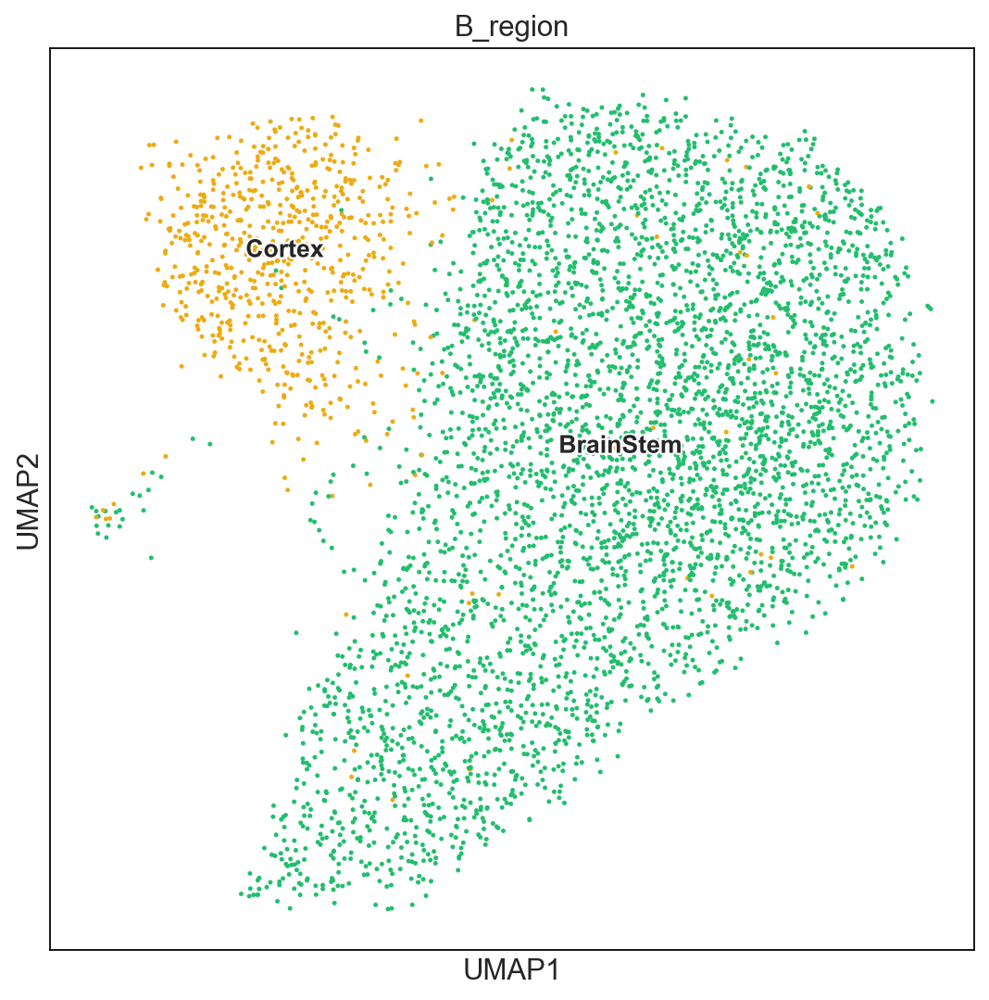

In [32]:
sc.pl.umap(adata_oligo,
           color=['PhenoGraph_clusters_oligo'],
           ncols=2,
           sort_order=False,
           palette=godsnot_64, # 'palette' specifies the colormap to use
           cmap='Spectral_r',
           legend_loc='on data',
           legend_fontsize=12, size = 20,
           legend_fontoutline=2,)

sc.pl.umap(adata_oligo, 
           color= ['Sample ID'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= ["#F2DD66", "#9A1B27", "#0359AE", "#14B09B"],
           size=20, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Astrocytes Sample ID"])

sc.pl.umap(adata_oligo,
           color=['Condition'],
           ncols=2,
           sort_order=False,
           palette=['#0488FC','#F64E2C'], # 'palette' specifies the colormap to use
           cmap='Spectral_r',
           legend_fontsize=12, size = 20,
           legend_fontoutline=2)

sc.pl.umap(adata_oligo,
           color=['B_region'],
           ncols=2,
           sort_order=False,
           palette= ["#22BE6E", "#EDAB13"], # 'palette' specifies the colormap to use
           cmap='Spectral_r',
           legend_loc='on data',
           legend_fontsize=12, size = 20,
           legend_fontoutline=2)



## Find markers (Oligo clusters)

In [33]:
cl_int_to_str = dict()
cl_int_to_str = {
    0 : 'Oligo0',
    1 : 'Oligo1',
    2 : 'Oligo2',
    3 : 'Oligo3',
    4 : 'Oligo4',
    5 : 'Oligo5',
    6 : 'Oligo6'}

adata_oligo.obs['PhenoGraph_clusters_oligo_str'] = adata_oligo.obs['PhenoGraph_clusters_oligo'].map(cl_int_to_str).astype('category')

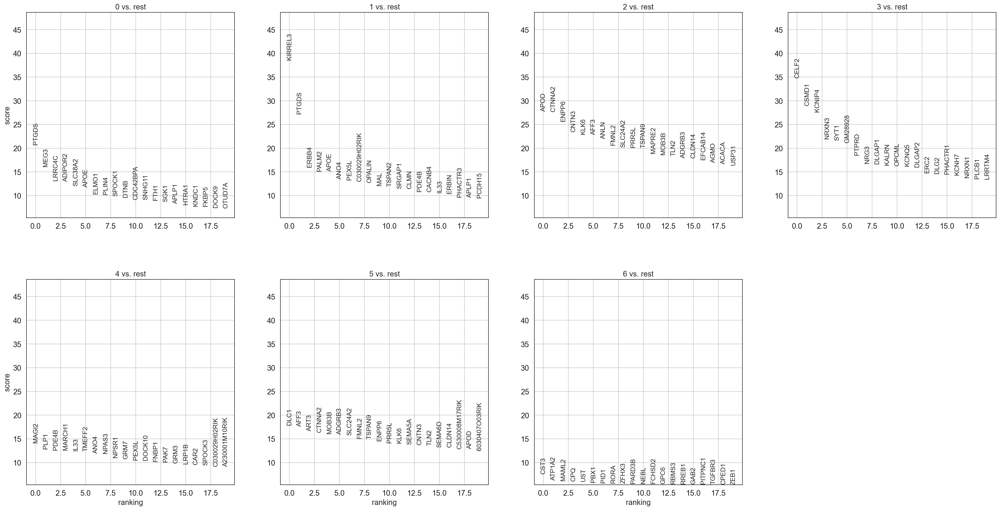

In [34]:
sc.tl.rank_genes_groups(adata_oligo, groupby='PhenoGraph_clusters_oligo', key_added="ranked_genes_pheno_oligo", method='wilcoxon')
sc.pl.rank_genes_groups(adata_oligo, key = 'ranked_genes_pheno_oligo', fontsize=12)

## Visualize marker genes using heatmap

In [35]:
adata_oligo.layers['scaled'] = sc.pp.scale(adata_oligo, copy=True).X

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


{'heatmap_ax': <AxesSubplot:>,
 'groupby_ax': <AxesSubplot:xlabel='PhenoGraph_clusters_oligo_str'>,
 'dendrogram_ax': <AxesSubplot:>,
 'gene_groups_ax': <AxesSubplot:>}

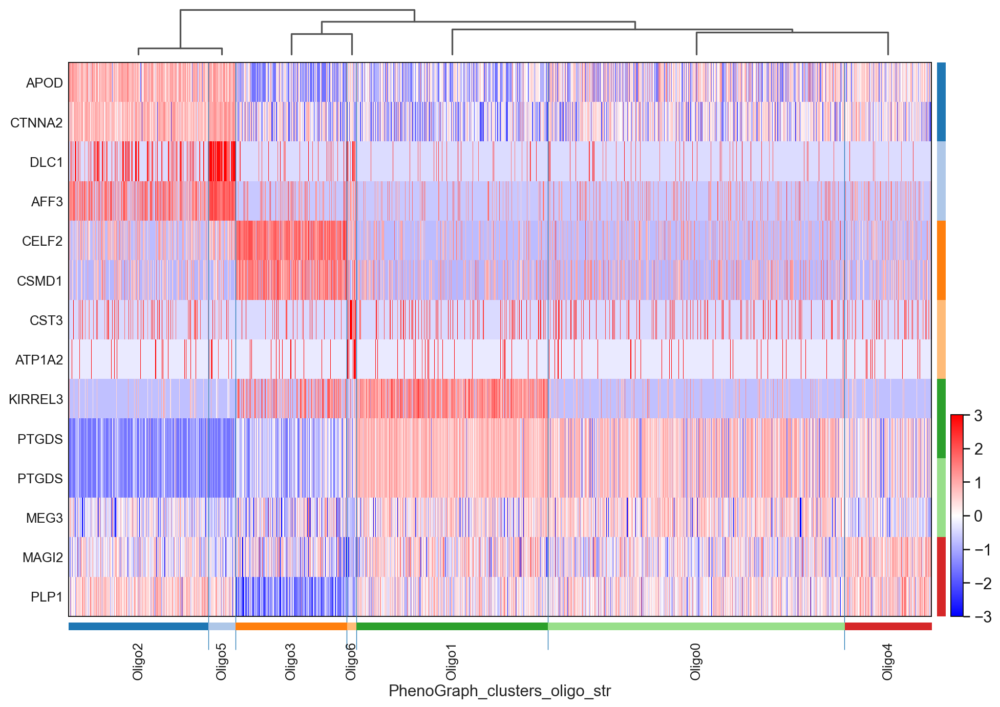

In [36]:
sc.tl.rank_genes_groups(adata_oligo, groupby='PhenoGraph_clusters_oligo_str', n_genes=adata_oligo.shape[1], method='wilcoxon')
sc.pl.rank_genes_groups_heatmap(adata_oligo, n_genes=2, use_raw=False, swap_axes=True, vmin=-3, vmax=3, cmap='bwr', layer='scaled', figsize=(14,10), show=False)

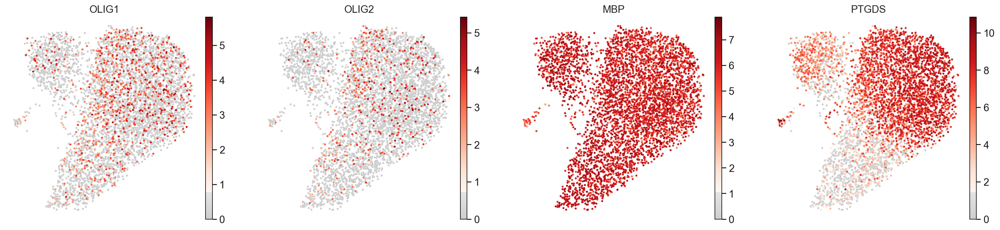

In [37]:
sc.set_figure_params(figsize=(5, 5))
colors2 = plt.cm.Reds(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsComb = np.vstack([colors3, colors2])
mymap = matplotlib.colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)
 
sc.pl.umap(adata_oligo,
           size = 30,
           color=['OLIG1','OLIG2','MBP','PTGDS'],
           color_map=mymap,
          frameon=False, )

## Save result Adata Oligodendrocytes

In [63]:
#adata_oligo.write_h5ad(outdir+'adata_high_var_Oligo_diff_norm_clusters.h5ad')

In [11]:
adata_oligo = sc.read_h5ad(outdir+'adata_high_var_Oligo_diff_norm_clusters.h5ad')

## Differential expression with MAST for Cortex & Brainstem

Load the adata object that holds the latest cell type annotations..

In [12]:
run_MAST_for_celltype(adata_oligo, "Oligodendrocytes")

Oligodendrocytes	Dimensions	(4804, 13466)
Files written for Oligodendrocytes
Running ./runMAST.R DEA/Oligodendrocytes/adata_Oligodendrocytes_exp_mat.csv DEA/Oligodendrocytes/adata_Oligodendrocytes_cdata.csv DEA/Oligodendrocytes/MAST_DEA_Oligodendrocytes_cort.csv DEA/Oligodendrocytes/MAST_DEA_Oligodendrocytes_bs.csv


'Finished running MAST on( Oligodendrocytes) in 1125.2840713669998 seconds.'

### Brainstem Enrichr 

In [14]:
# import the MAST results
mast_oligo_res = pd.read_csv (filepath_or_buffer= 'DEA/Oligodendrocytes/MAST_DEA_Oligodendrocytes_bs.csv')
print(mast_oligo_res)

         gene              p      p.fdr.adj     logFC
0      TMEFF2  3.692473e-112  4.972284e-108 -0.819979
1       FKBP5  1.098874e-108  7.398716e-105  1.234355
2       PTPRD  1.999211e-108  8.973791e-105 -0.646126
3       FNBP1  3.970212e-108  1.336572e-104 -0.970619
4       PDE4B  1.071977e-107  2.887048e-104 -0.621993
...       ...            ...            ...       ...
4687   ZFP169   1.737922e-02   4.992078e-02 -0.049241
4688     TNKS   1.739171e-02   4.994601e-02 -0.030312
4689    YIF1A   1.740616e-02   4.997682e-02 -0.039551
4690    TFCP2   1.741272e-02   4.998502e-02  0.043349
4691  ZKSCAN1   1.741835e-02   4.999051e-02  0.019473

[4692 rows x 4 columns]


In [16]:
#filter DE results
mast_oligo_res = mast_oligo_res.sort_values(by='logFC', ascending=False)
# Upregulated genes
mast_oligo_res_UP = mast_oligo_res[(mast_oligo_res['logFC'] >=0.01) & (mast_oligo_res['p.fdr.adj'] <= 0.05)]
mast_oligo_res_DOWN = mast_oligo_res[(mast_oligo_res['logFC'] <=0.01) & (mast_oligo_res['p.fdr.adj'] <= 0.05)]
#mast_C0_res_UP['gene'].head(20)
mast_oligo_res_UP.head(n=10)

,gene,p,p.fdr.adj,logFC
7,SGK3,1.719490e-91,2.894332e-88,1.326990
13,DTNB,3.275205e-82,3.150280e-79,1.274708
1,FKBP5,1.098874e-108,7.398716e-105,1.234355
10,ACACA,2.635440e-90,3.226258e-87,1.188823
19,CAMK1D,7.117108e-74,4.791949e-71,1.104588
23,HTRA1,1.338015e-68,7.507379e-66,1.075749
9,ADIPOR2,1.353902e-90,1.823164e-87,1.048618
8,PLIN4,1.153606e-90,1.726051e-87,1.019497
18,ZFAND4,1.225077e-74,8.682575e-72,0.966419
69,ANLN,1.335598e-34,2.569310e-32,0.957627


In [17]:
#Available databases : ‘Human’, ‘Mouse’, ‘Yeast’, ‘Fly’, ‘Fish’, ‘Worm’ 
import gseapy
gene_set_names = gseapy.get_library_name(database='Mouse')
#print(gene_set_names)

mast_oligo_res_UP_n_list = mast_oligo_res_UP.gene.str.strip().tolist()
enr_res = gseapy.enrichr(gene_list=mast_oligo_res_UP_n_list,
                     organism='Mouse',
                     gene_sets=['KEGG_2019_Mouse'],
                     description='pathway',
                     cutoff = 0.5)

In [18]:
enr_res.results.head(10)

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,KEGG_2019_Mouse,Autophagy,48/130,1.482337e-12,4.239483e-10,0,0,4.093323,111.491471,BECN1;RAB7;MTMR3;IRS1;PIK3R4;ITPR1;IRS2;PIK3CB...
1,KEGG_2019_Mouse,Ubiquitin mediated proteolysis,49/138,4.667016e-12,6.673833e-10,0,0,3.849945,100.446984,UBE3C;UBE2Z;UBE2L3;HERC3;HERC1;UBE2Q2;BTRC;SKP...
2,KEGG_2019_Mouse,Protein processing in endoplasmic reticulum,52/163,1.050843e-10,1.001803e-08,0,0,3.275693,75.263172,TRAM1;HSP90AB1;NGLY1;HERPUD1;MAN1A2;SKP1A;PDIA...
3,KEGG_2019_Mouse,FoxO signaling pathway,40/132,7.166574e-08,5.124100e-06,0,0,3.028834,49.828122,CDKN1A;IRS1;SETD7;PRKAG2;IRS2;PIK3CB;STK4;EGFR...
4,KEGG_2019_Mouse,Pancreatic cancer,27/75,2.027773e-07,1.159886e-05,0,0,3.908107,60.228457,RB1;CDKN1A;PIK3CB;EGFR;CDC42;MAPK9;MAPK8;MAPK1...
5,KEGG_2019_Mouse,Choline metabolism in cancer,31/99,9.319593e-07,4.428018e-05,0,0,3.168774,44.001521,DGKB;PDGFA;PIK3CB;EGFR;MAPK9;NRAS;MAPK8;PDGFD;...
6,KEGG_2019_Mouse,Mitophagy,23/63,1.201377e-06,4.428018e-05,0,0,3.990422,54.397603,USP8;BECN1;RAB7;CSNK2A1;TFEB;AMBRA1;MAPK10;BCL...
7,KEGG_2019_Mouse,Lysine degradation,22/59,1.347645e-06,4.428018e-05,0,0,4.125473,55.764650,KMT2E;SETD2;SETD3;ECHS1;KMT2A;SETDB1;PRDM6;EHM...
8,KEGG_2019_Mouse,mRNA surveillance pathway,30/96,1.455651e-06,4.428018e-05,0,0,3.158583,42.451533,DAZAP1;SMG1;CASC3;SMG5;GSPT1;PPP1CB;PNN;PPP1CC...
9,KEGG_2019_Mouse,Neurotrophin signaling pathway,35/121,1.548258e-06,4.428018e-05,0,0,2.830434,37.866629,YWHAE;CAMK2D;IRS1;PIK3CB;RAP1B;CDC42;MAPK9;NRA...


## Oligo Brainstem

In [20]:
adata_oligo_BS = adata_oligo.copy()
adata_oligo_BS = adata_oligo_BS[adata_oligo_BS.obs['B_region'].isin(['BrainStem']),:]
adata_oligo_BS.shape

/Users/fragkogs/miniconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


(4132, 13466)

In [21]:
adata_oligo_BS.obs.Condition.value_counts()

VE         2752
Control    1380
Name: Condition, dtype: int64

Trying to set attribute `.uns` of view, copying.


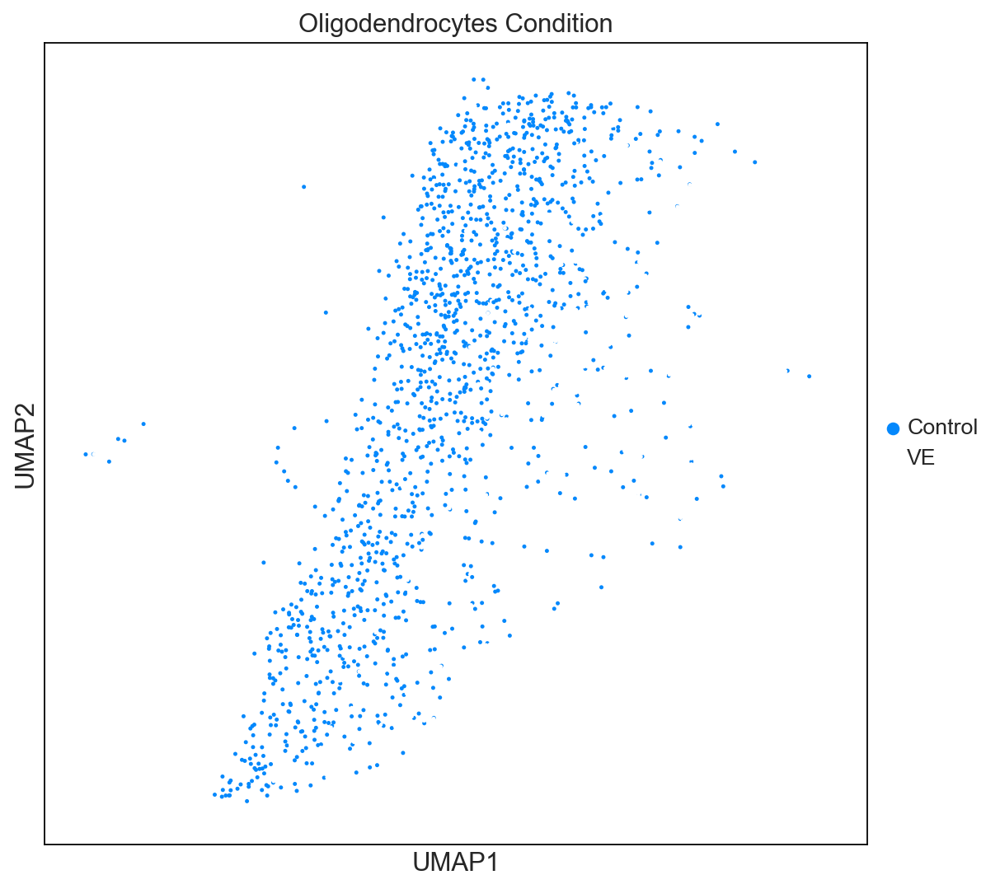

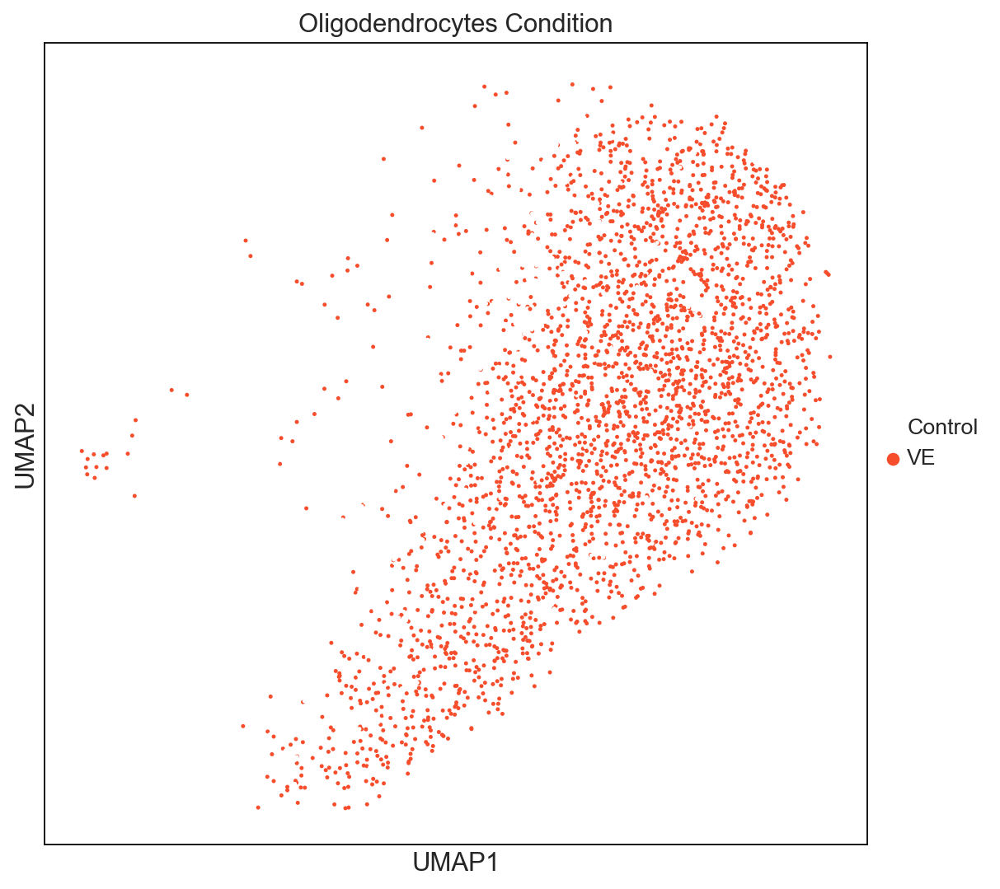

In [41]:
sc.set_figure_params(figsize=(8, 8))
sc.pl.umap(adata_oligo_BS, 
           color= ['Condition'],
           ncols=2,
           edges = False,
           edges_width= 0.01,
           palette=['#0488FC','#FFFFFFFF'],
           size=20, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Oligodendrocytes Condition"])


sc.pl.umap(adata_oligo_BS, 
           color= ['Condition'],
           ncols=2,
           edges = False,
           edges_width= 0.01,
           palette=['#FFFFFFFF','#F64E2C'],
           size=20, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Oligodendrocytes Condition"])

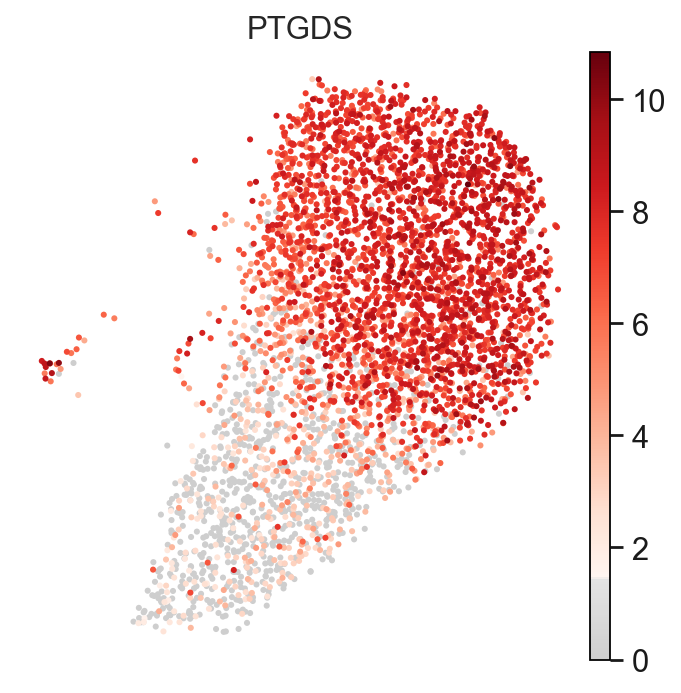

In [20]:
sc.set_figure_params(figsize=(5, 5))
colors2 = plt.cm.Reds(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsComb = np.vstack([colors3, colors2])
mymap = matplotlib.colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)
 
sc.pl.umap(adata_oligo_BS,
           size = 30,
           color=['PTGDS'],
           color_map=mymap,
          frameon=False, )

### Oligodendrocytes BS control 

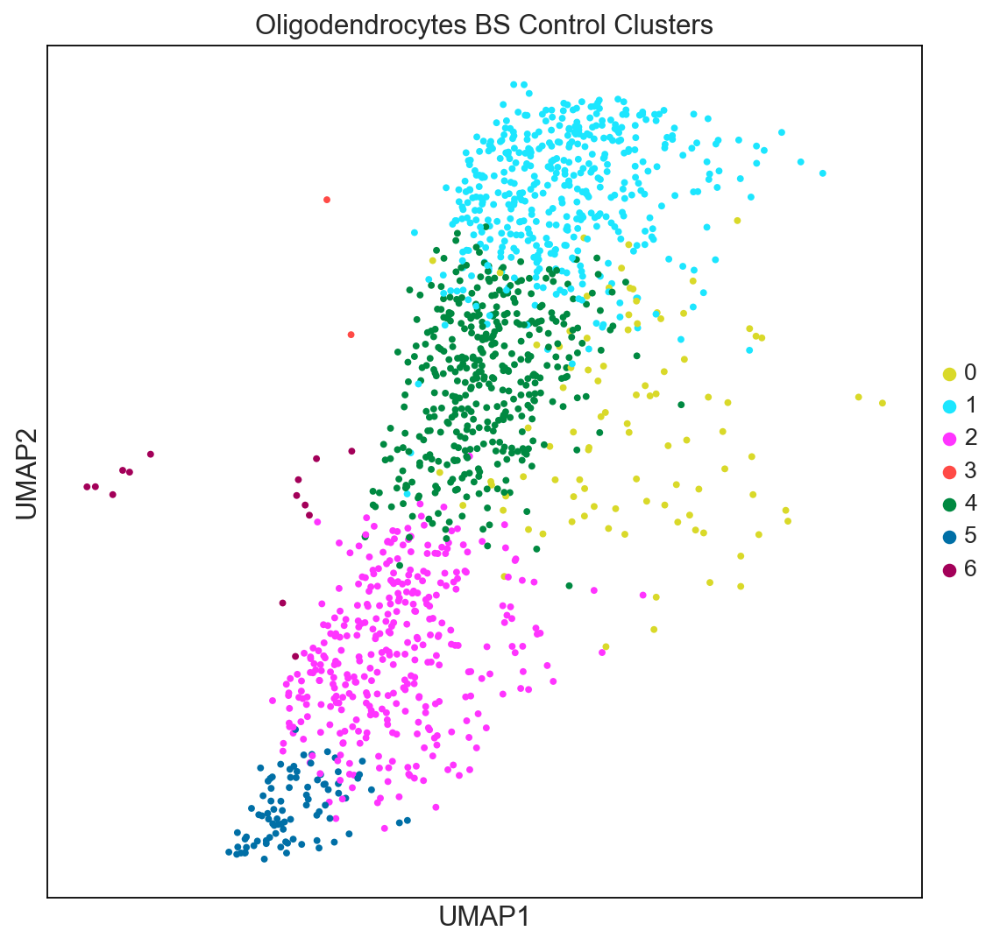

In [15]:
adata_oligo_BS_control = adata_oligo_BS[adata_oligo_BS.obs['Condition'].isin(['Control']),:].copy()

sc.set_figure_params(figsize=(8, 8))
sc.pl.umap(adata_oligo_BS_control, 
           color= ['PhenoGraph_clusters_oligo'],
           ncols=2,
           edges = False,
           edges_width= 0.01,
           palette=godsnot_64,
           size=50, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Oligodendrocytes BS Control Clusters"])

In [43]:
cell_counts_per_cluster_BS_ctrl = adata_oligo_BS_control.obs.PhenoGraph_clusters_oligo.value_counts()
cell_counts_per_cluster_BS_ctrl = cell_counts_per_cluster_BS_ctrl.to_frame()
cell_counts_per_cluster_BS_ctrl

,PhenoGraph_clusters_oligo
1,439
4,399
2,347
0,93
5,86
6,14
3,2


### Oligodendrocytes BS VE

/Users/fragkogs/miniconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


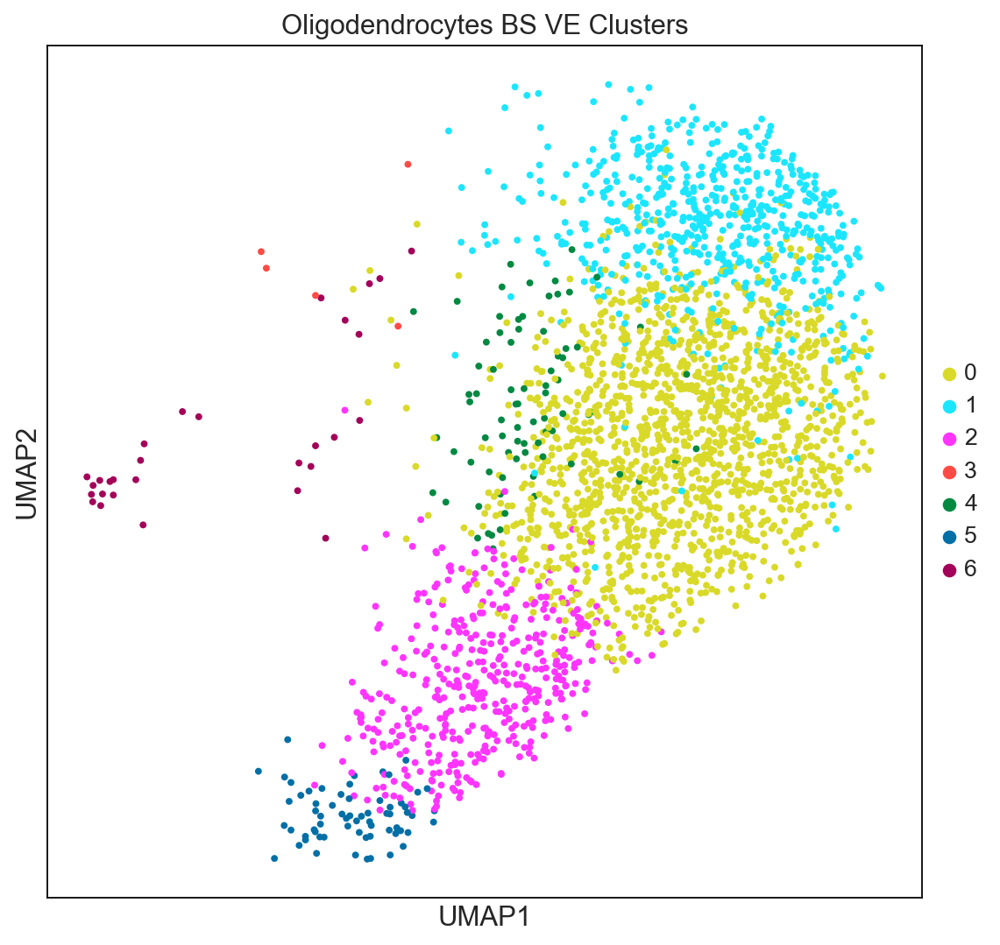

In [41]:
adata_oligo_BS_VE = adata_oligo_BS[adata_oligo_BS.obs['Condition'].isin(['VE']),:].copy()

sc.set_figure_params(figsize=(8, 8))
sc.pl.umap(adata_oligo_BS_VE, 
           color= ['PhenoGraph_clusters_oligo'],
           ncols=2,
           edges = False,
           edges_width= 0.01,
           palette=godsnot_64,
           size=50, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Oligodendrocytes BS VE Clusters"])

In [45]:
cell_counts_per_cluster_BS_VE = adata_oligo_BS_VE.obs.PhenoGraph_clusters_oligo.value_counts()
cell_counts_per_cluster_BS_VE = cell_counts_per_cluster_BS_VE.to_frame()
cell_counts_per_cluster_BS_VE

,PhenoGraph_clusters_oligo
0,1542
1,611
2,422
4,78
5,65
6,29
3,5


### Heatmaps of gene expression of top DEA genes

### All Brainstem samples

In [37]:
marker_genes_dict = dict()

marker_genes_dict = {'Oligo-BS': mast_oligo_res_UP['gene'].head(20)}

categories: Oligo0_Control, Oligo0_VE, Oligo1_Control, etc.
var_group_labels: Oligo-BS


/Users/fragkogs/miniconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/Users/fragkogs/miniconda3/envs/std/lib/python3.8/site-packages/scanpy/plotting/_matrixplot.py:222: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  __ = ax.pcolor(_color_df, **kwds)


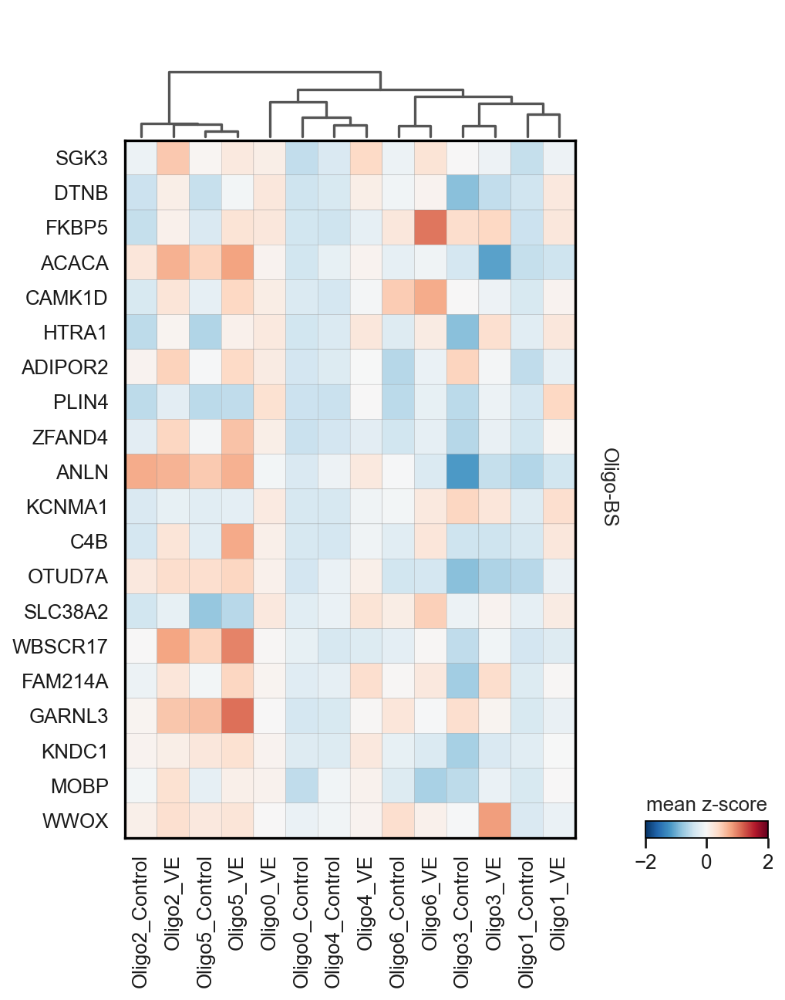

categories: Oligo0_Control, Oligo0_VE, Oligo1_Control, etc.
var_group_labels: Oligo-BS


/Users/fragkogs/miniconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


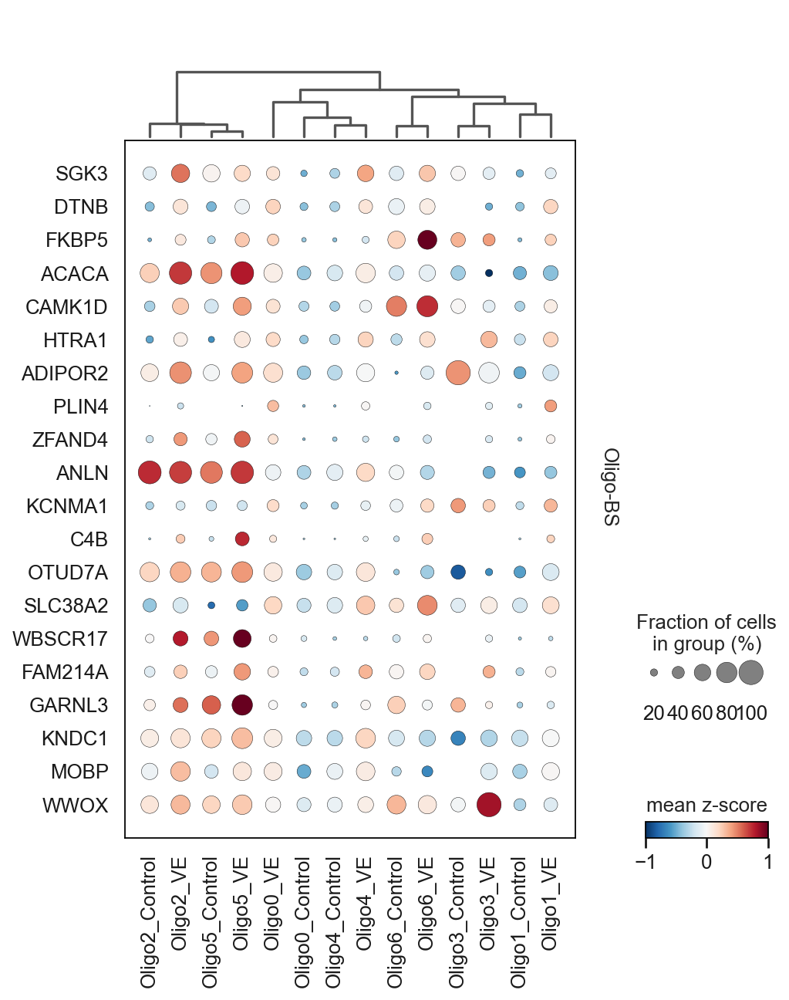

/Users/fragkogs/miniconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


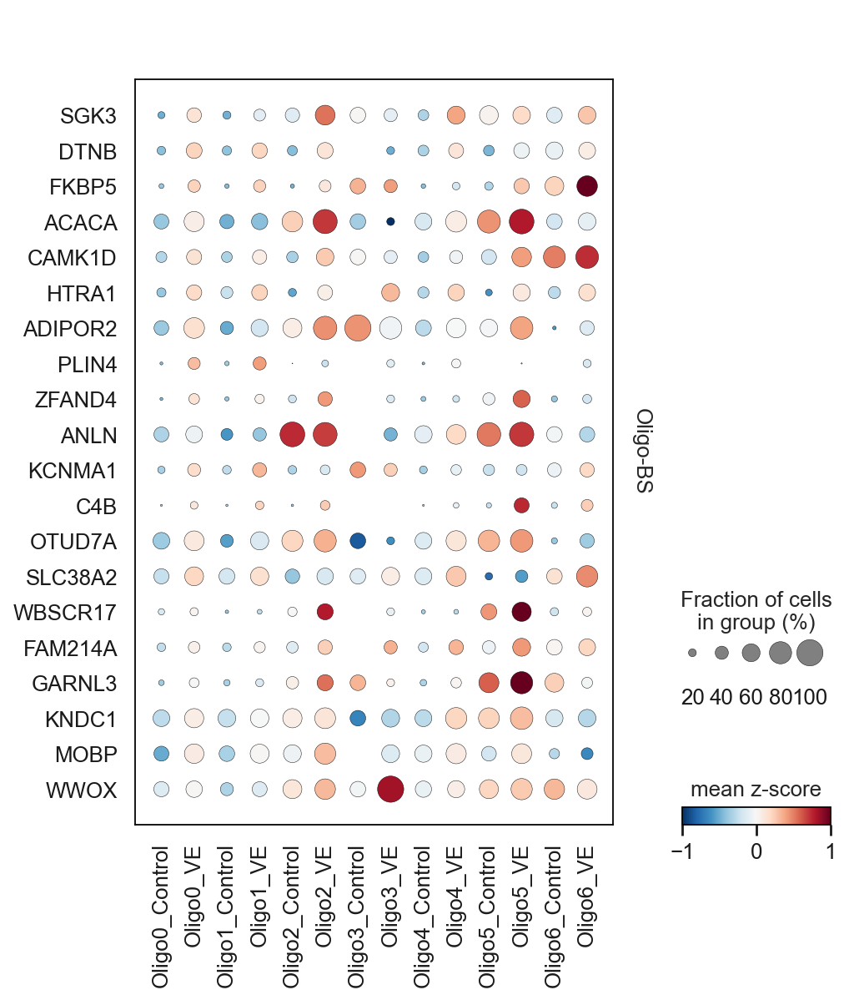

In [45]:
adata_oligo_BS.layers['scaled'] = sc.pp.scale(adata_oligo_BS, copy=True).X
sc.pl.matrixplot(adata_oligo_BS, marker_genes_dict, groupby=['PhenoGraph_clusters_oligo_str','Condition'], dendrogram=True,
                 colorbar_title='mean z-score', layer='scaled', vmin=-2, vmax=2, cmap='RdBu_r',swap_axes=True)

sc.pl.dotplot(adata_oligo_BS, marker_genes_dict, groupby=['PhenoGraph_clusters_oligo_str','Condition'], dendrogram=True,
             colorbar_title='mean z-score', layer='scaled', vmin=-1, vmax=1, cmap='RdBu_r',swap_axes=True)

sc.pl.dotplot(adata_oligo_BS, marker_genes_dict, groupby=['PhenoGraph_clusters_oligo_str','Condition'], dendrogram=False,
             colorbar_title='mean z-score', layer='scaled', vmin=-1, vmax=1, cmap='RdBu_r',swap_axes=True)

/Users/fragkogs/miniconda3/envs/std/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/fragkogs/miniconda3/envs/std/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


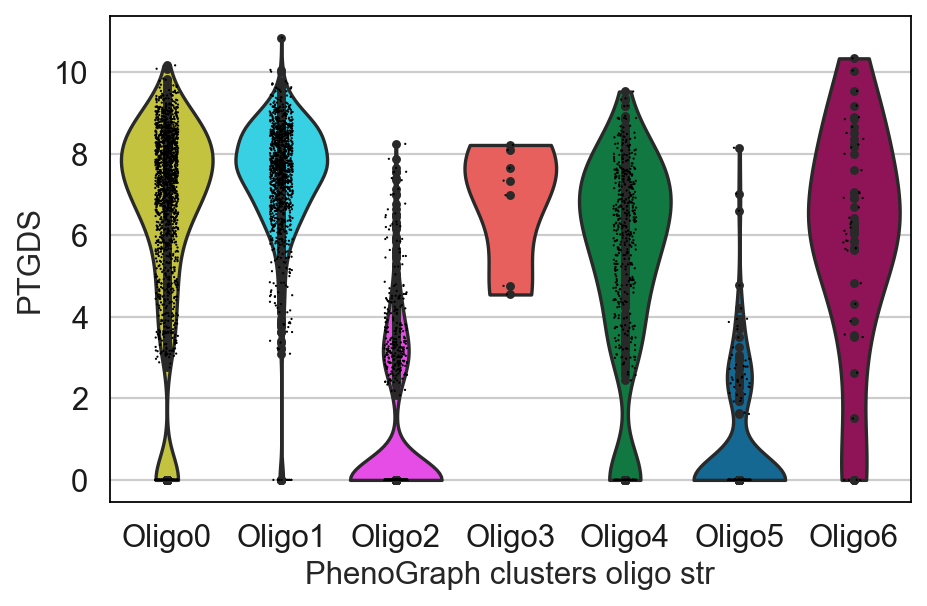

In [47]:
sc.set_figure_params(figsize=(6, 4))
sc.pl.violin(adata_oligo_BS, ['PTGDS'], groupby='PhenoGraph_clusters_oligo_str', inner='point', palette = godsnot_64)

### Only VE

categories: Oligo0, Oligo1, Oligo2, etc.
var_group_labels: Oligo-BS


/Users/fragkogs/miniconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


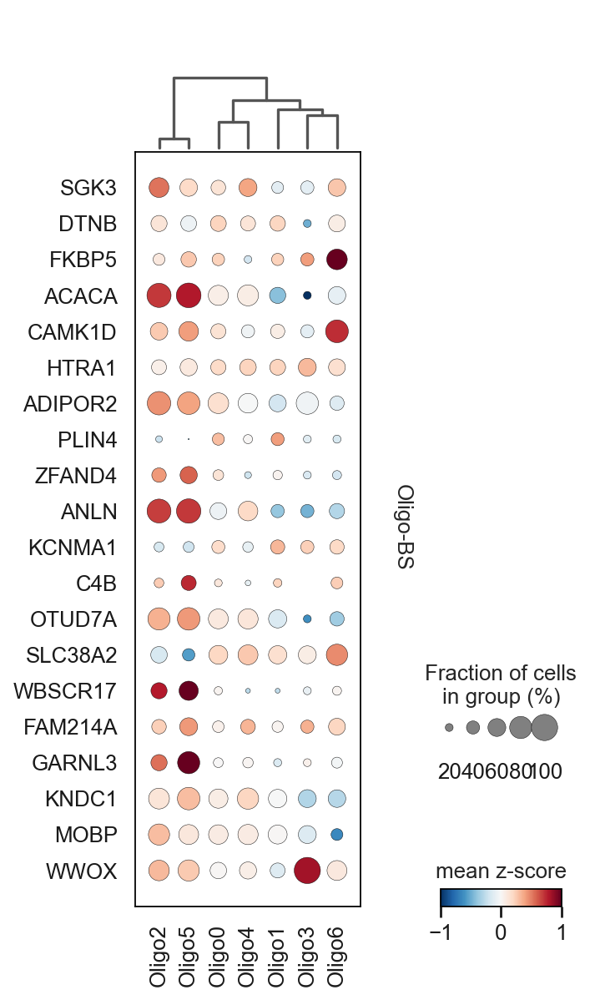

/Users/fragkogs/miniconda3/envs/std/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/fragkogs/miniconda3/envs/std/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


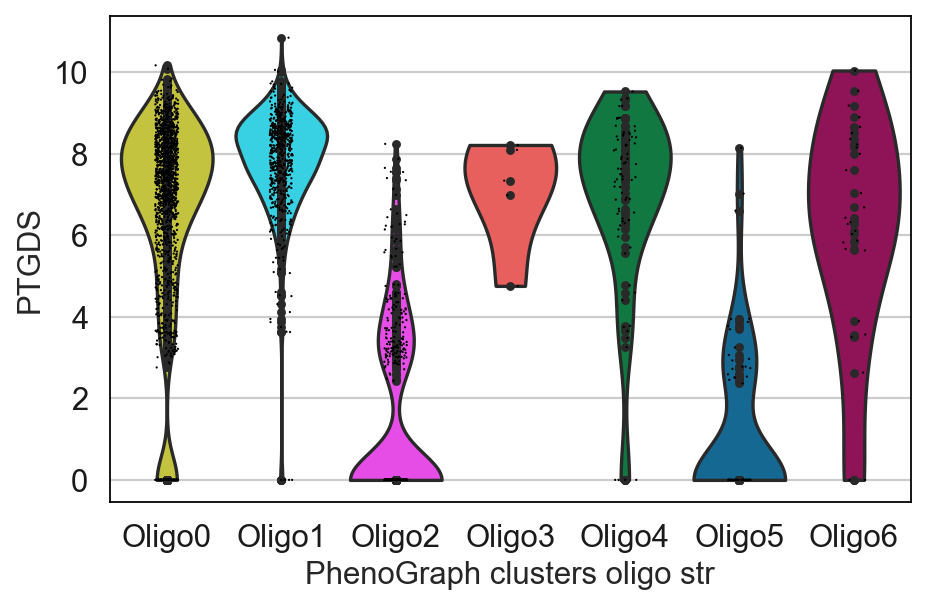

In [48]:
sc.pl.dotplot(adata_oligo_BS_VE, marker_genes_dict, groupby=['PhenoGraph_clusters_oligo_str'], dendrogram=True,
             colorbar_title='mean z-score', layer='scaled', vmin=-1, vmax=1, cmap='RdBu_r',swap_axes=True)
sc.pl.violin(adata_oligo_BS_VE, ['PTGDS'], groupby='PhenoGraph_clusters_oligo_str', inner='point', palette = godsnot_64)
#"#d9d929", "#1CE6FF", "#FF34FF", "#FF4A46"

## Oligo Cortex

In [49]:
adata_oligo_cortex = adata_oligo.copy()
adata_oligo_cortex = adata_oligo_cortex[adata_oligo_cortex.obs['B_region'].isin(['Cortex']),:]
adata_oligo_cortex.shape

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


(672, 13466)

In [50]:
adata_oligo_cortex.obs.Condition.value_counts()

Control    363
VE         309
Name: Condition, dtype: int64

Trying to set attribute `.uns` of view, copying.


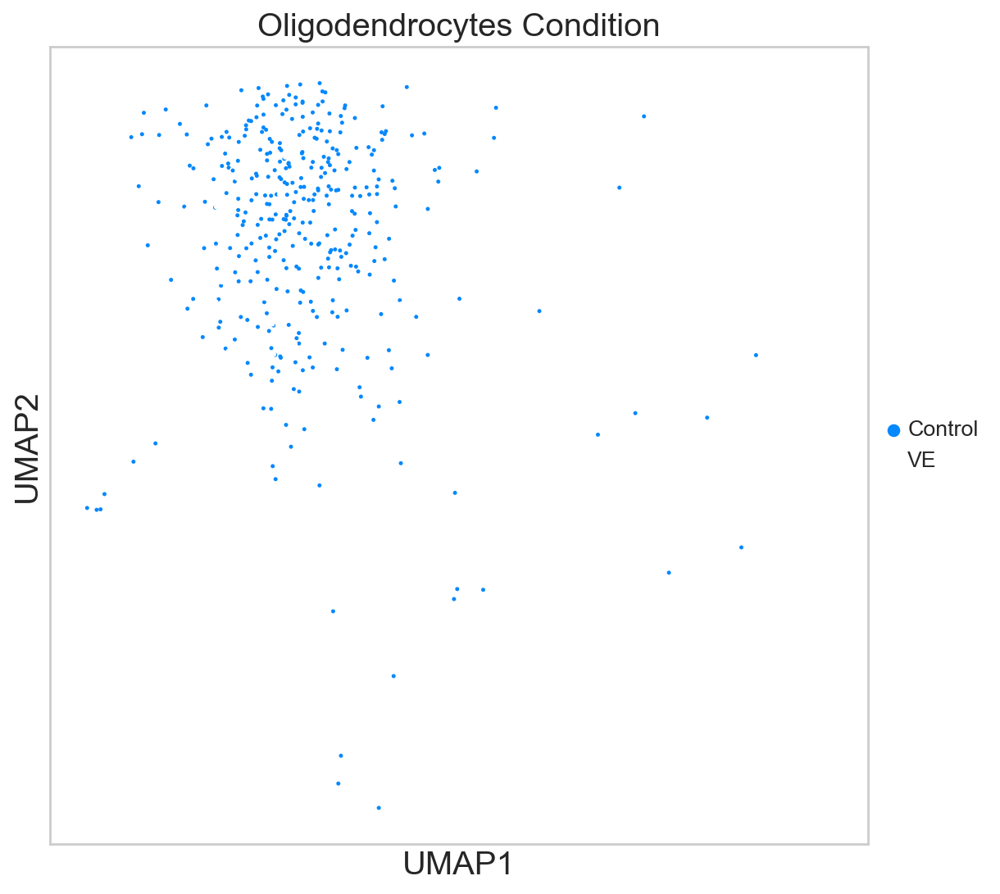

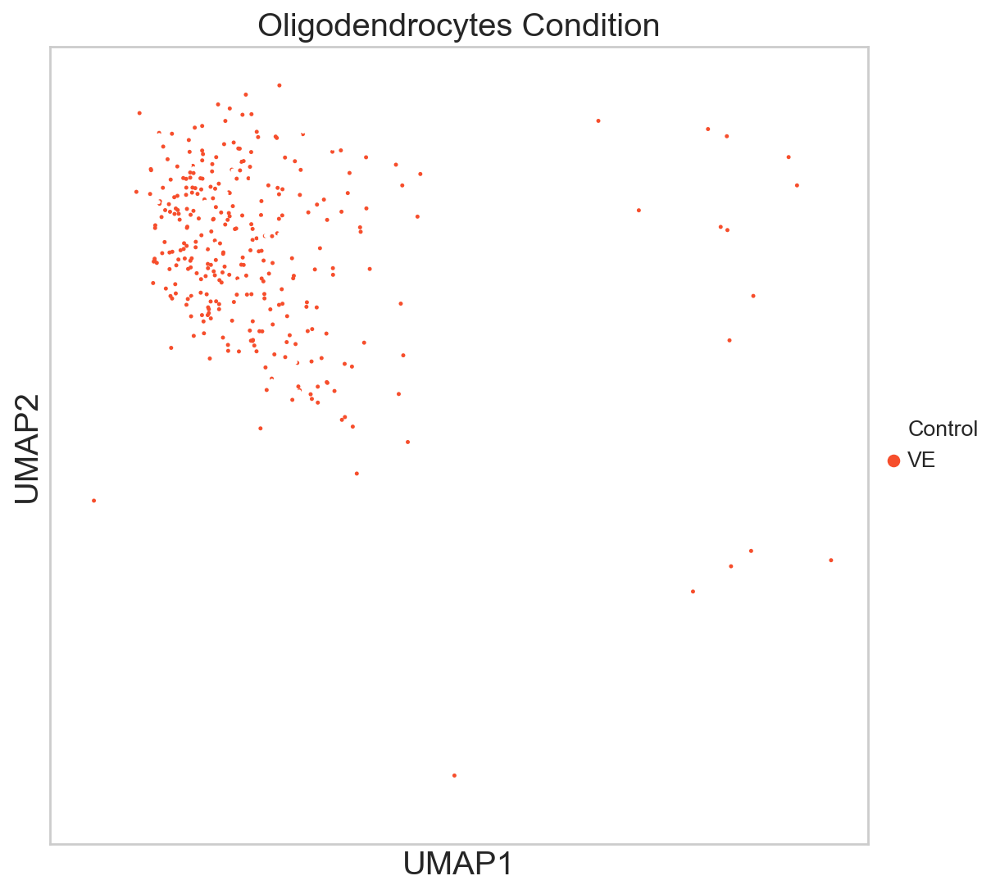

In [51]:
sc.pl.umap(adata_oligo_cortex, 
           color= ['Condition'],
           ncols=2,
           edges = False,
           edges_width= 0.01,
           palette=['#0488FC','#FFFFFFFF'],
           size=20, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Oligodendrocytes Condition"])


sc.pl.umap(adata_oligo_cortex, 
           color= ['Condition'],
           ncols=2,
           edges = False,
           edges_width= 0.01,
           palette=['#FFFFFFFF','#F64E2C'],
           size=20, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Oligodendrocytes Condition"])

### Oligodendrocytes Cortex control 

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


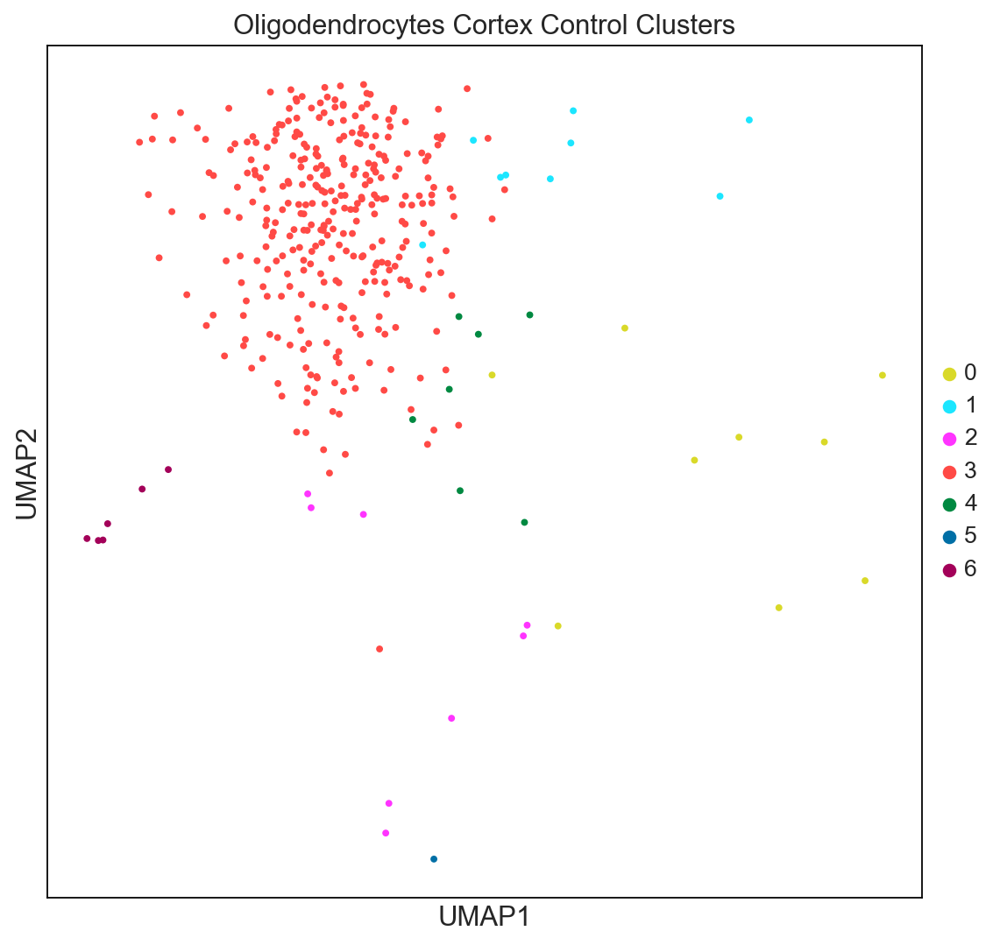

In [57]:
adata_oligo_cortex_control = adata_oligo_cortex[adata_oligo_cortex.obs['Condition'].isin(['Control']),:].copy()

sc.set_figure_params(figsize=(8, 8))
sc.pl.umap(adata_oligo_cortex_control, 
           color= ['PhenoGraph_clusters_oligo'],
           ncols=2,
           edges = False,
           edges_width= 0.01,
           palette=godsnot_64,
           size=50, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Oligodendrocytes Cortex Control Clusters"])

In [53]:
cell_counts_per_cluster_cortex_control = adata_oligo_cortex_control.obs.PhenoGraph_clusters_oligo.value_counts()
cell_counts_per_cluster_cortex_control = cell_counts_per_cluster_cortex_control.to_frame()
cell_counts_per_cluster_cortex_control

,PhenoGraph_clusters_oligo
3,323
0,9
1,9
2,8
4,7
6,6
5,1


### Oligodendrocytes cortex VE

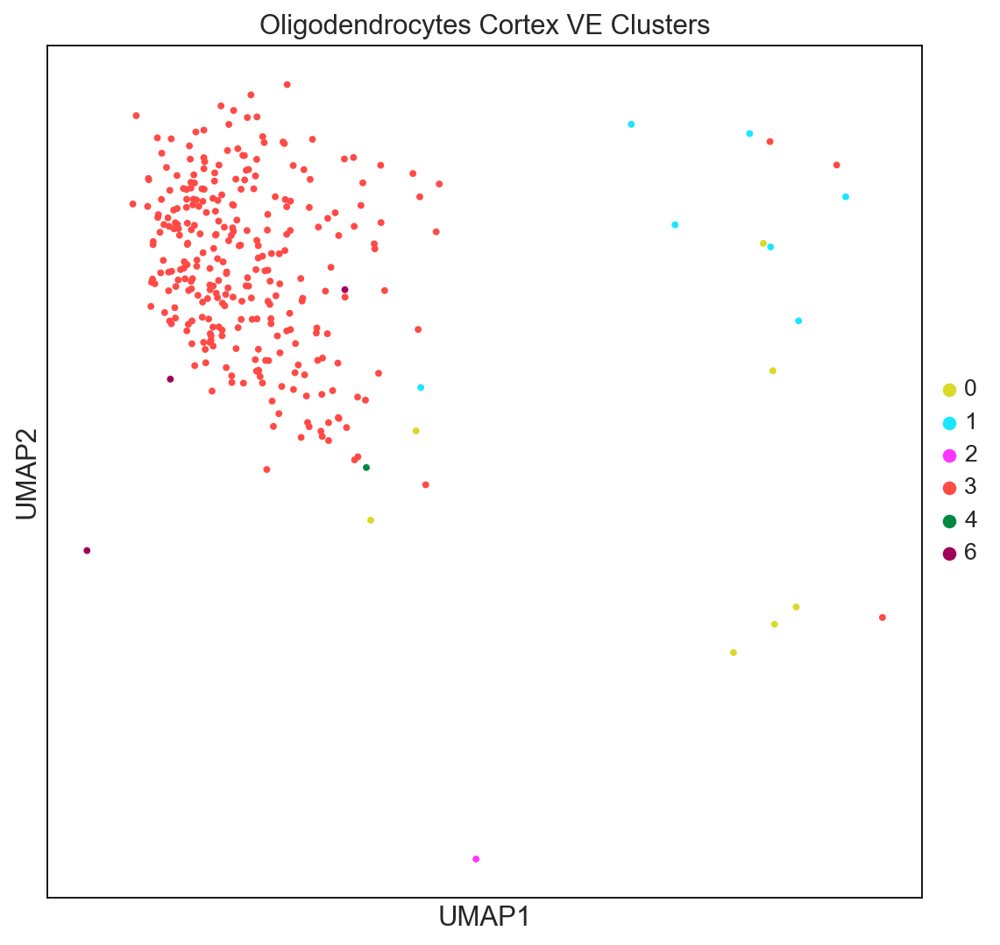

In [58]:
adata_oligo_cortex_VE = adata_oligo_cortex[adata_oligo_cortex.obs['Condition'].isin(['VE']),:].copy()

sc.set_figure_params(figsize=(8, 8))
sc.pl.umap(adata_oligo_cortex_VE, 
           color= ['PhenoGraph_clusters_oligo'],
           ncols=2,
           edges = False,
           edges_width= 0.01,
           palette=["#d9d929", "#1CE6FF", "#FF34FF", "#FF4A46", "#008941", "#A30059"],
           size=50, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Oligodendrocytes Cortex VE Clusters"])

In [59]:
 cell_counts_per_cluster_cortex_VE = adata_oligo_cortex_VE.obs.PhenoGraph_clusters_oligo.value_counts()
cell_counts_per_cluster_cortex_VE = cell_counts_per_cluster_cortex_VE.to_frame()
cell_counts_per_cluster_cortex_VE

,PhenoGraph_clusters_oligo
3,290
0,7
1,7
6,3
2,1
4,1


### Heatmaps of gene expression

In [67]:
marker_genes_dict = dict()

marker_genes_dict = {'Oligo-Cortex':['PTGDS',
'FKBP5',
'PLIN4',
'ADIPOR2',
'APOD',
'DTNB',
'HIF3A',
'SGK3',
'ELMO1',
'FAM169A',
'ZFAND4',
'HTRA1',
'FTH1',
'GLI2',
'ITIH5',
'APBB2',
'SLC38A2',
'SLC25A13',
'ANLN',
'SPOCK1']}



categories: Oligo0_Control, Oligo0_VE, Oligo1_Control, etc.
var_group_labels: Oligo-Cortex


/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/scanpy/plotting/_matrixplot.py:222: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  __ = ax.pcolor(_color_df, **kwds)


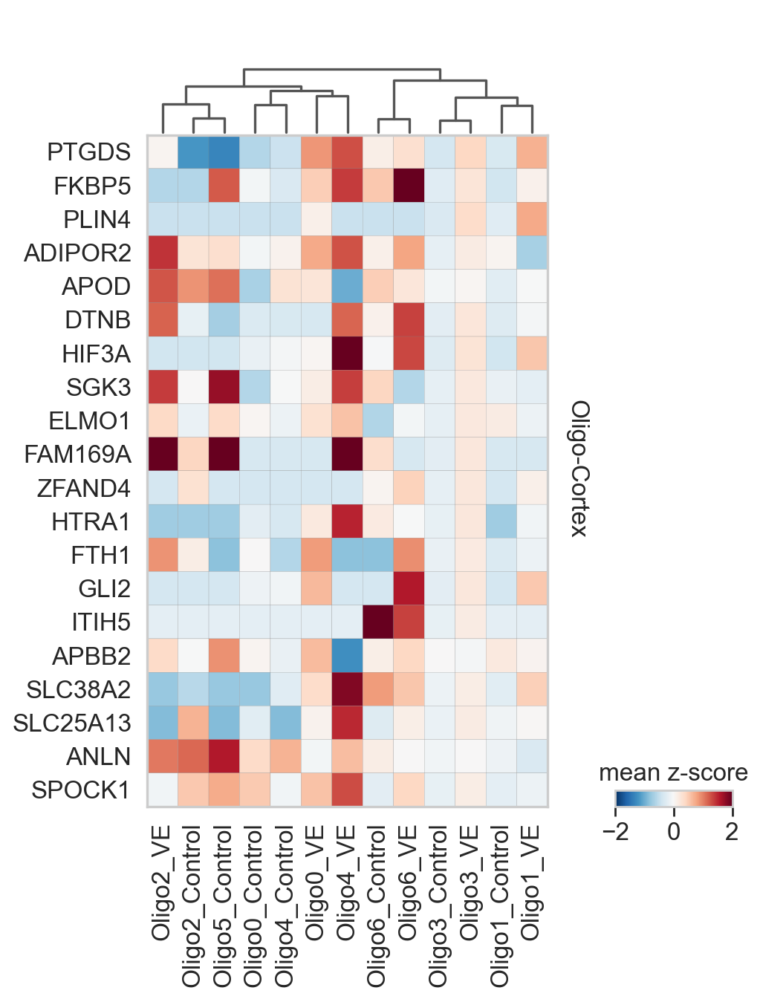

categories: Oligo0_Control, Oligo0_VE, Oligo1_Control, etc.
var_group_labels: Oligo-Cortex


/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


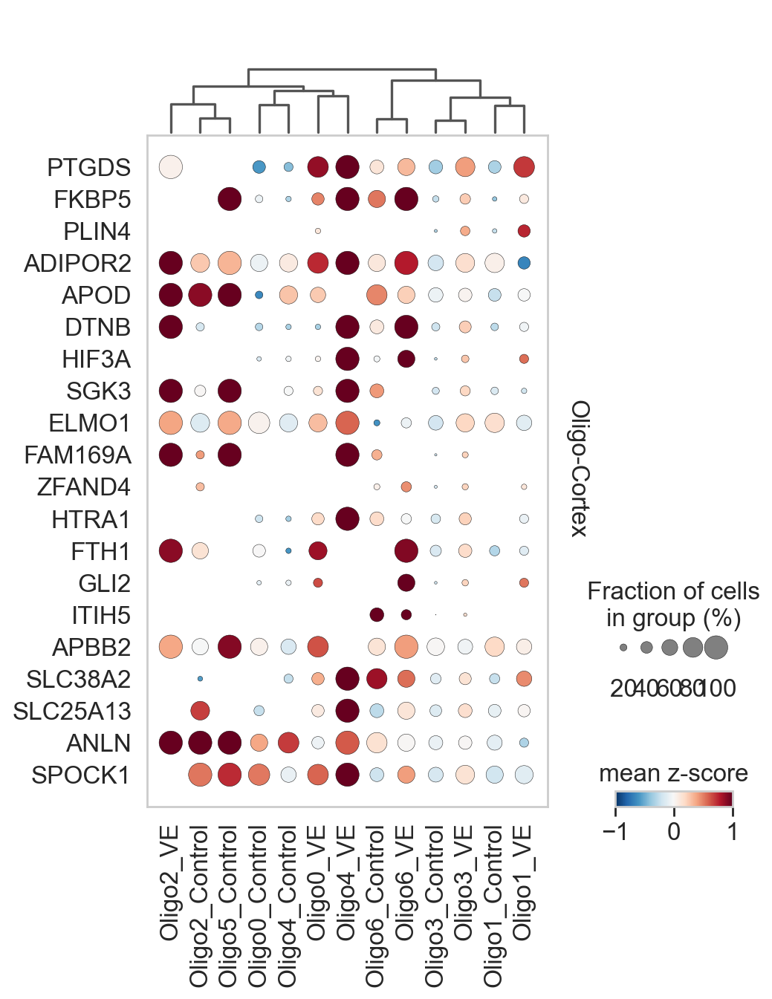

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


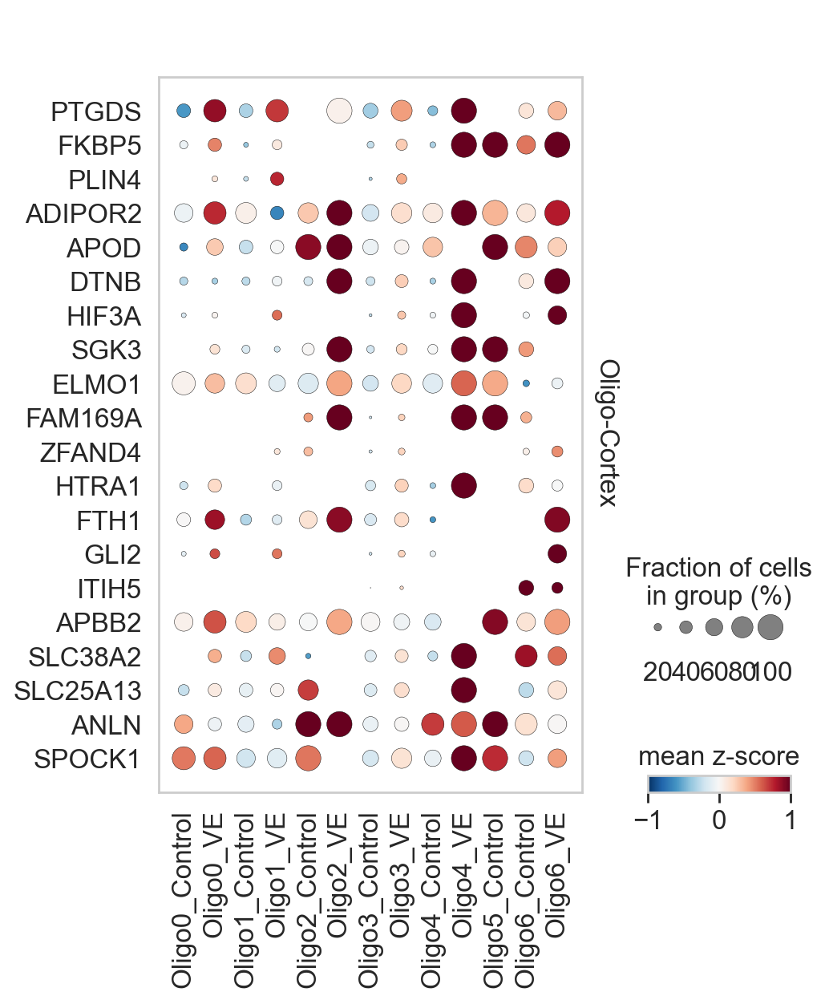

In [68]:
 adata_oligo_cortex.layers['scaled'] = sc.pp.scale( adata_oligo_cortex, copy=True).X
sc.pl.matrixplot( adata_oligo_cortex, marker_genes_dict, groupby=['PhenoGraph_clusters_oligo_str','Condition'], dendrogram=True,
                 colorbar_title='mean z-score', layer='scaled', vmin=-2, vmax=2, cmap='RdBu_r',swap_axes=True)


sc.pl.dotplot( adata_oligo_cortex, marker_genes_dict, groupby=['PhenoGraph_clusters_oligo_str','Condition'], dendrogram=True,
             colorbar_title='mean z-score', layer='scaled', vmin=-1, vmax=1, cmap='RdBu_r',swap_axes=True)

sc.pl.dotplot( adata_oligo_cortex, marker_genes_dict, groupby=['PhenoGraph_clusters_oligo_str','Condition'], dendrogram=False,
             colorbar_title='mean z-score', layer='scaled', vmin=-1, vmax=1, cmap='RdBu_r',swap_axes=True)

### Make a grouped bar plot of the number of cells per cluster per condition

**Brainstem**

In [46]:
# First merge the 2 data frames by indeces
mergedDF= cell_counts_per_cluster_BS_ctrl.merge(cell_counts_per_cluster_BS_VE, left_index=True, right_index=True, suffixes=('_Control', '_VE'),how = 'outer')
mergedDF.rename(columns = {'PhenoGraph_clusters_oligo_Control' : 'Control', 'PhenoGraph_clusters_oligo_VE' : 'VE'}, inplace = True)
mergedDF

,Control,VE
0,93,1542
1,439,611
2,347,422
3,2,5
4,399,78
5,86,65
6,14,29


In [47]:
mergedDF = mergedDF.reset_index()
mergedDF = mergedDF.melt(id_vars=["index"])
mergedDF.rename(columns = {'index' : 'ClusterID', 'variable' : 'Condition', 'value' : 'N_cells'}, inplace = True)
mergedDF

,ClusterID,Condition,N_cells
0,0,Control,93
1,1,Control,439
2,2,Control,347
3,3,Control,2
4,4,Control,399
5,5,Control,86
6,6,Control,14
7,0,VE,1542
8,1,VE,611
9,2,VE,422


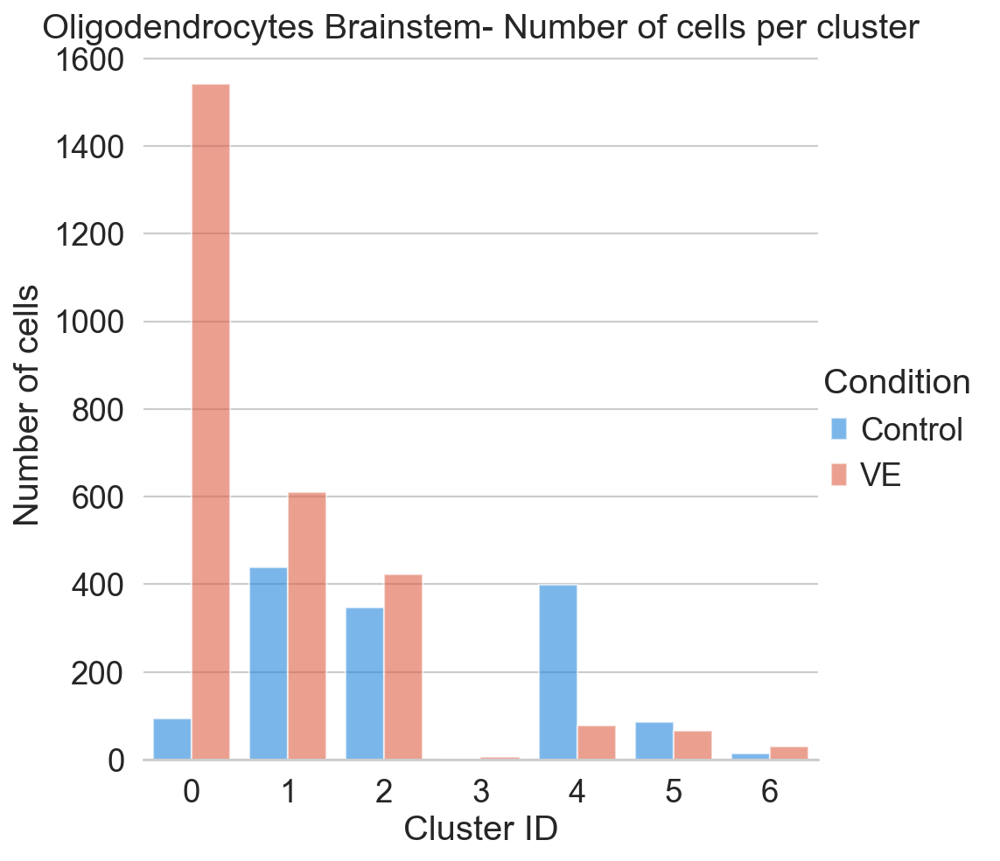

In [48]:
sns.set(font_scale=1.5, style = 'whitegrid') 
# Draw a nested barplot by species and sex
g = sns.catplot(
    data=mergedDF, kind="bar",
    x="ClusterID", y="N_cells", hue="Condition",
    ci="sd", palette=['#0488FC','#F64E2C'], alpha=.6, height=6
)
g.despine(left=True)
g.set(title='Oligodendrocytes Brainstem- Number of cells per cluster')
g.set_axis_labels("Cluster ID", "Number of cells")

**Cortex**

In [60]:
# First merge the 2 data frames by indeces
mergedDF_2= cell_counts_per_cluster_cortex_control.merge(cell_counts_per_cluster_cortex_VE, left_index=True, right_index=True, suffixes=('_Control', '_VE'), how = 'outer')
mergedDF_2.rename(columns = {'PhenoGraph_clusters_oligo_Control' : 'Control', 'PhenoGraph_clusters_oligo_VE' : 'VE'}, inplace = True)
mergedDF_2

,Control,VE
0,9,7.0
1,9,7.0
2,8,1.0
3,323,290.0
4,7,1.0
5,1,NaN
6,6,3.0


In [61]:
mergedDF_2 = mergedDF_2.reset_index()
mergedDF_2 = mergedDF_2.melt(id_vars=["index"])
mergedDF_2.rename(columns = {'index' : 'ClusterID', 'variable' : 'Condition', 'value' : 'N_cells'}, inplace = True)
mergedDF_2

,ClusterID,Condition,N_cells
0,0,Control,9.0
1,1,Control,9.0
2,2,Control,8.0
3,3,Control,323.0
4,4,Control,7.0
5,5,Control,1.0
6,6,Control,6.0
7,0,VE,7.0
8,1,VE,7.0
9,2,VE,1.0


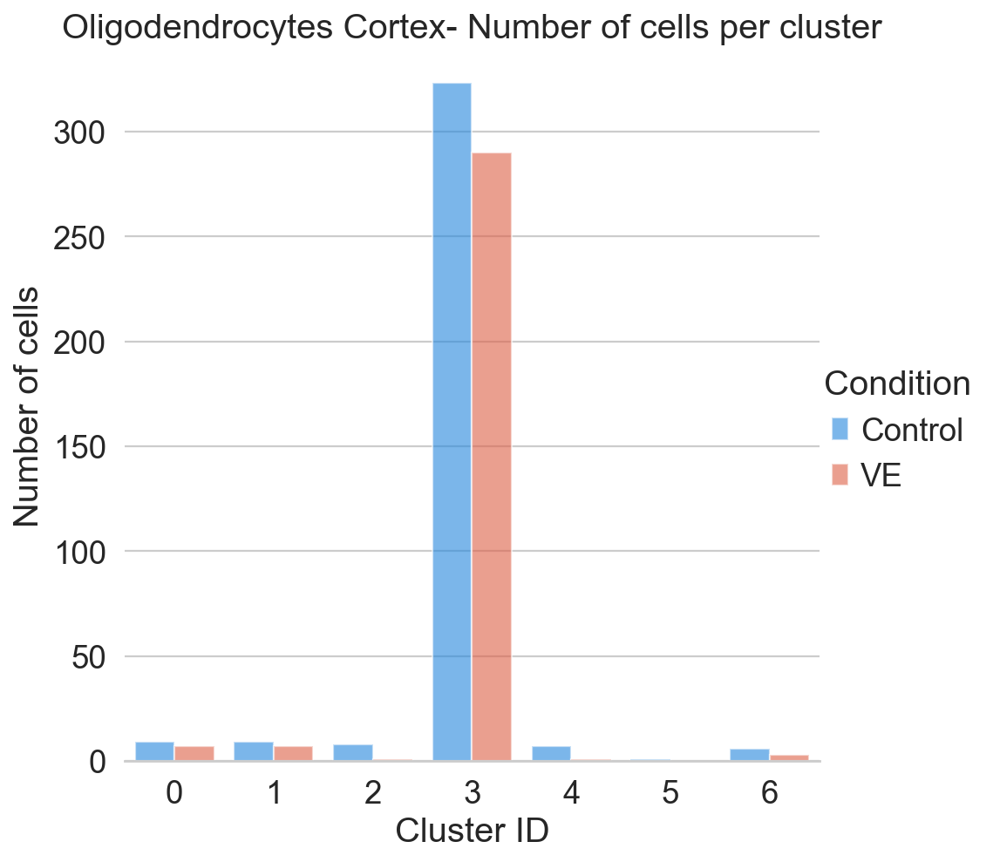

In [62]:
sns.set(font_scale=1.5, style = 'whitegrid') 
# Draw a nested barplot by species and sex
g = sns.catplot(
    data=mergedDF_2, kind="bar",
    x="ClusterID", y="N_cells", hue="Condition",
    ci="sd", palette=['#0488FC','#F64E2C'], alpha=.6, height=6
)
g.despine(left=True)
g.set(title='Oligodendrocytes Cortex- Number of cells per cluster')
g.set_axis_labels("Cluster ID", "Number of cells")

## Brainstem - Tests markers between specific clusters  

In [ ]:
#sc.pl.violin(adata_astro_BS, ['FKBP5','CACNA2D3','SGCD','NELL2','APOE','CST3'], groupby='PhenoGraph_clusters_astro', inner='point', palette = godsnot_64, )

## Compare Clusters 0+1+3+4 (VE) Versus All Controls

### T-test 

In [50]:
adata_oligo_BS_copy = adata_oligo_BS.copy()
# For loop creating a groups for pairwise comparison
adata_oligo_BS_copy.obs['groups'] = ['group_0_1_3_4VE' if int(i) in [0,1,3,4] and j == 'VE' else 'group_restCTRL' if j == 'Control' else 'Error' for i,j in zip(adata_oligo_BS_copy.obs['PhenoGraph_clusters_oligo'],adata_oligo_BS_copy.obs['Condition'] )]


In [51]:
adata_oligo_BS_copy.obs.groups.value_counts()

group_0_1_3_4VE    2236
group_restCTRL     1380
Error               516
Name: groups, dtype: int64

In [52]:
#adata_oligo_BS_copy.obs[['groups','PhenoGraph_clusters_astro','PhenoGraph_clusters_astro_str','Condition']]

In [53]:
# select only cells that are in these 2 groups that I want to compare
adata_oligo_BS_to_compare = adata_oligo_BS_copy[[group in ['group_restCTRL', 'group_0_1_3_4VE'] for group in adata_oligo_BS_copy.obs['groups']],].copy()
adata_oligo_BS_to_compare.obs.groups.value_counts()

/Users/fragkogs/miniconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


group_0_1_3_4VE    2236
group_restCTRL     1380
Name: groups, dtype: int64

/Users/fragkogs/miniconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'groups' as categorical


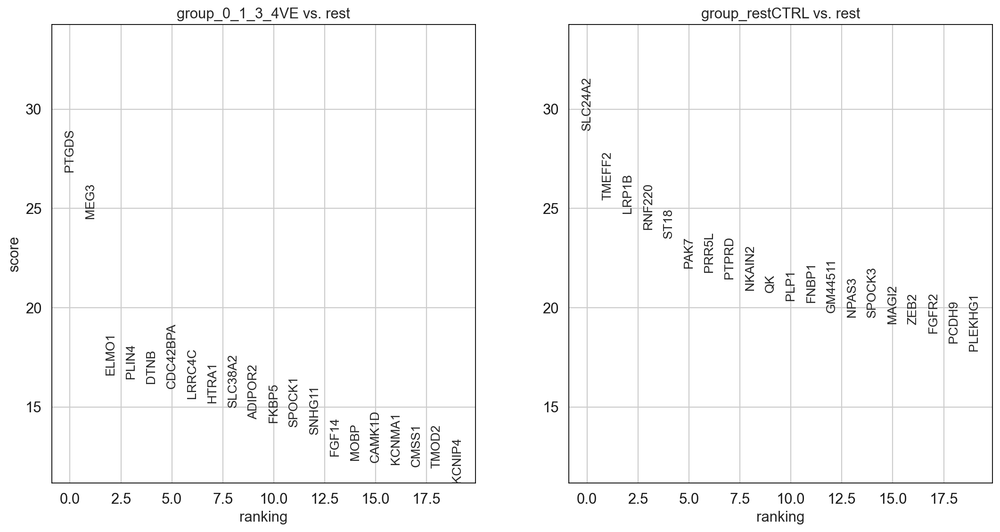

In [54]:
sc.set_figure_params(figsize=(8, 8))
key_ad = 'group_0_1_3_4VE'
n_genes = 100000

sc.tl.rank_genes_groups(adata_oligo_BS_to_compare, groupby='groups', key_added="group_0_1_3_4VE", method='wilcoxon')
sc.pl.rank_genes_groups(adata_oligo_BS_to_compare, key = 'group_0_1_3_4VE', fontsize=12)

result = adata_oligo_BS_to_compare.uns[key_ad]
groups = result['names'].dtype.names
pval_table = pd.DataFrame(
        {group + '_' + key[:1]: result[key][group]
        for group in groups for key in ['names','logfoldchanges', 'pvals_adj']}).head(n_genes)
#pval_table.to_excel(os.path.join("/Users/fragkogs/Desktop/", key_ad + '_' + method + '_pval_table_' + '_clusters_' + str(n_genes) + 'genes_filtered_corrected.xlsx'), engine='openpyxl')

In [58]:
pval_table = pval_table.sort_values(by= 'group_0_1_3_4VE_l', ascending=False)
pval_table[(pval_table.group_0_1_3_4VE_p < 0.05) & (pval_table.group_0_1_3_4VE_l > 0.5)].head(10)

,group_0_1_3_4VE_n,group_0_1_3_4VE_l,group_0_1_3_4VE_p,group_restCTRL_n,group_restCTRL_l,group_restCTRL_p
3,PLIN4,4.204049,7.296306e-58,RNF220,2.240179,3.043807e-123
0,PTGDS,3.802560,6.694592e-155,SLC24A2,1.320359,6.902566e-180
34,C4B,3.305224,7.960475e-15,EPHB1,1.894234,5.899262e-49
10,FKBP5,3.032982,2.394901e-43,PLP1,0.629471,4.814780e-89
134,CDKN1A,2.964246,3.068261e-02,SIK3,1.165881,3.488019e-18
77,ITIH5,2.950575,9.845544e-05,TLN2,1.915968,1.284469e-26
24,HIF3A,2.812938,9.609396e-22,CAR2,1.969113,3.304061e-53
31,GLI2,2.467409,1.667810e-16,ZDHHC14,1.910609,2.323002e-49
4,DTNB,2.265905,2.725181e-56,ST18,1.680424,9.748324e-119
7,HTRA1,2.071757,1.040473e-49,PTPRD,0.878614,5.411086e-99


### MAST 

In [60]:
cell_type = 'Oligodendrocytes_C0_1_3_4'
expmat = pd.DataFrame(adata_oligo_BS_to_compare.X, columns = adata_oligo_BS_to_compare.var.index, index = adata_oligo_BS_to_compare.obs.index)
cdata = pd.DataFrame(adata_oligo_BS_to_compare.obs, columns=adata_oligo_BS_to_compare.obs.columns, index = adata_oligo_BS_to_compare.obs.index)
expmat.to_csv(r'DEA/'+ cell_type + '/adata_'+ cell_type+ '_exp_mat.csv', index=True)
cdata.to_csv(r'DEA/'+ cell_type + '/adata_'+ cell_type+ '_cdata.csv', index=True)

In [61]:
start_time = timeit.default_timer()
MAST = './runMAST_clusters.R'
expmat_Inputfile = ('DEA/'+ cell_type + '/adata_'+ cell_type+ '_exp_mat.csv')
cdata_Inputfile = ('DEA/'+ cell_type + '/adata_'+ cell_type+ '_cdata.csv')
output_file_cort = 'DEA/' +  cell_type + "/MAST_DEA_" + cell_type + "_RESULTS.csv" 

os.system(MAST + " " + expmat_Inputfile + " " + cdata_Inputfile + " " + output_file_cort + " " )
out_str = "Finished running MAST on"+ "( " + cell_type +  ")" +" in {} seconds.".format(timeit.default_timer()-start_time)

In [62]:
# import the MAST results
mast_C0_1_3_4_res = pd.read_csv (filepath_or_buffer= 'DEA/Oligodendrocytes_C0_1_3_4/MAST_DEA_Oligodendrocytes_C0_1_3_4_RESULTS.csv')
print(mast_C0_1_3_4_res)

          gene              p      p.fdr.adj     logFC
0        PLIN4  2.071490e-111  2.789468e-107  1.315209
1       TMEFF2   1.304708e-97   8.784597e-94 -0.849304
2        FKBP5   2.480781e-96   1.113540e-92  1.315363
3      SLC24A2   6.496406e-87   2.187015e-83 -0.663505
4         DTNB   2.601889e-82   7.007406e-79  1.418100
...        ...            ...            ...       ...
13461    NAT14   9.999469e-01   1.000000e+00 -0.000165
13462  OLFR318   9.999558e-01   1.000000e+00  0.000071
13463     PKP2   1.000000e+00   1.000000e+00 -0.000291
13464     SCD4   1.000000e+00   1.000000e+00 -0.000143
13465     SYT6   9.997830e-01   1.000000e+00  0.000154

[13466 rows x 4 columns]


In [67]:
#filter DE results
mast_C0_1_3_4_res = mast_C0_1_3_4_res.sort_values(by='logFC', ascending=False)
# Upregulated genes
mast_C0_1_3_4_res_UP = mast_C0_1_3_4_res[(mast_C0_1_3_4_res['logFC'] >=0.01) & (mast_C0_1_3_4_res['p.fdr.adj'] <= 0.05)]
mast_C0_1_3_4_res_DOWN = mast_C0_1_3_4_res[(mast_C0_1_3_4_res['logFC'] <=0.01) & (mast_C0_1_3_4_res['p.fdr.adj'] <= 0.05)]
mast_C0_1_3_4_res_UP['gene'].head(10)

21      PTGDS
4        DTNB
2       FKBP5
0       PLIN4
9        SGK3
10      HTRA1
13     KCNMA1
28    SLC38A2
20     CAMK1D
12    ADIPOR2
Name: gene, dtype: object

#### HEATMAP OF TOP10 UPREGULATED GENES

In [75]:
marker_genes_dict = dict()

marker_genes_dict = {'C0_1_3_4': mast_C0_1_3_4_res_UP['gene'].head(20)}

/Users/fragkogs/miniconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/Users/fragkogs/miniconda3/envs/std/lib/python3.8/site-packages/scanpy/plotting/_matrixplot.py:222: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  __ = ax.pcolor(_color_df, **kwds)


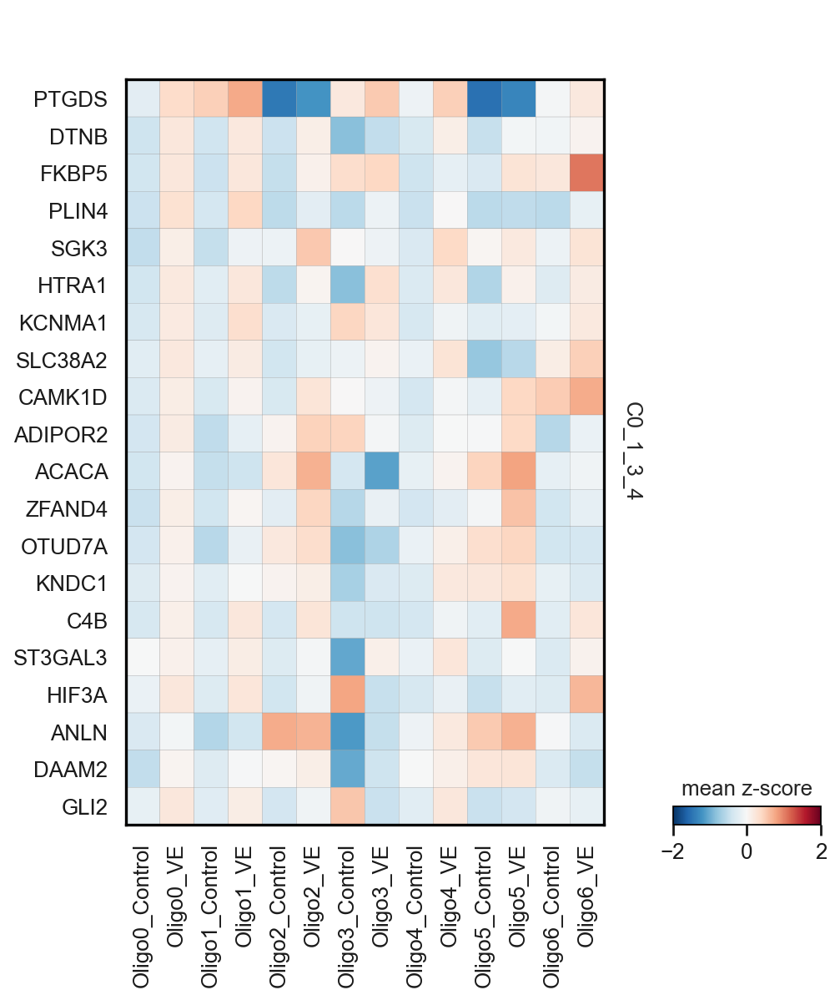

categories: Oligo0_Control, Oligo0_VE, Oligo1_Control, etc.
var_group_labels: C0_1_3_4


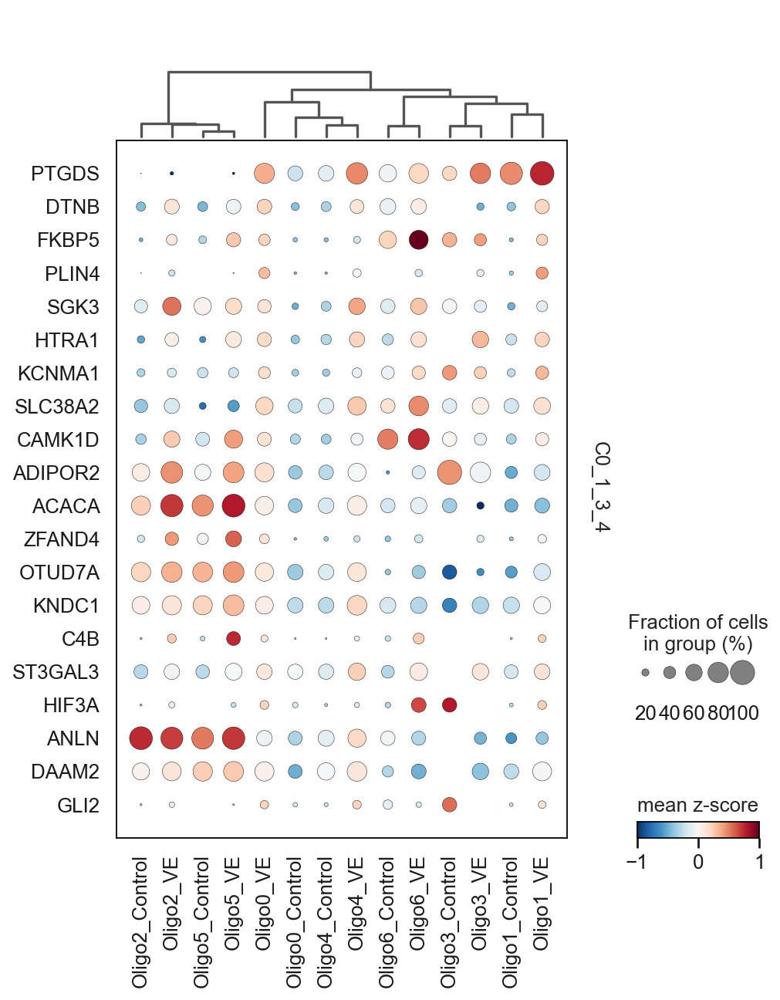

/Users/fragkogs/miniconda3/envs/std/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


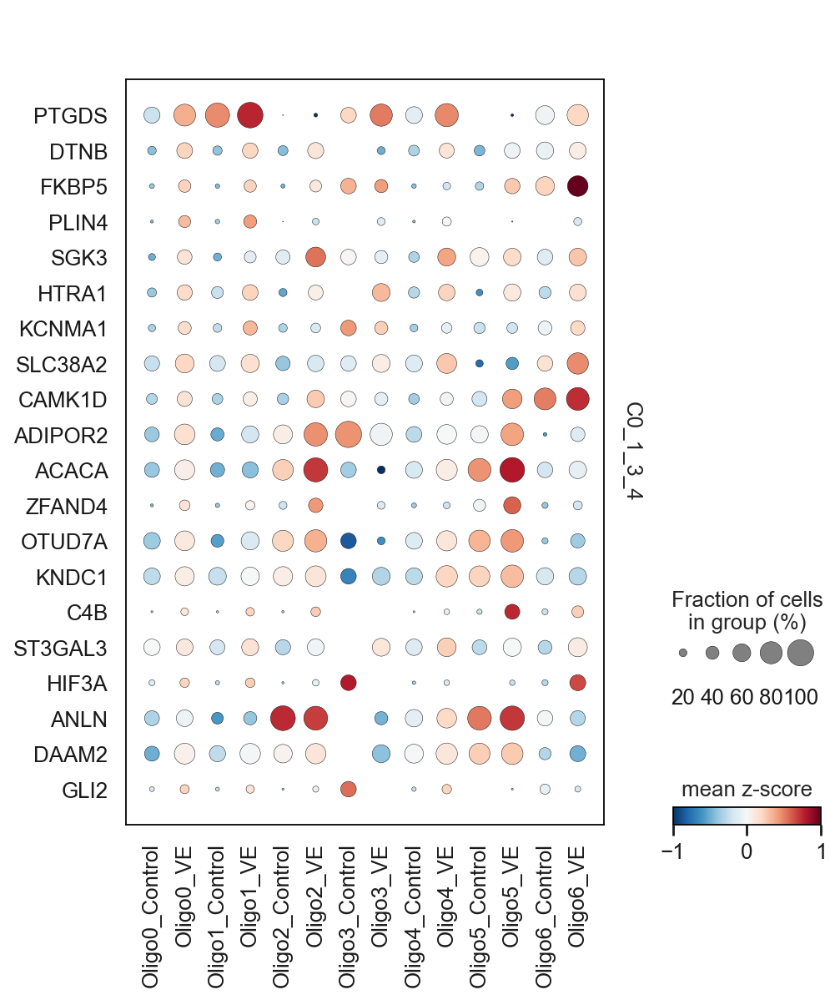

In [79]:
adata_oligo_BS.layers['scaled'] = sc.pp.scale(adata_oligo_BS, copy=True).X
sc.pl.matrixplot(adata_oligo_BS, marker_genes_dict, groupby=['PhenoGraph_clusters_oligo_str','Condition'], dendrogram=False,
                 colorbar_title='mean z-score', layer='scaled', vmin=-2, vmax=2, cmap='RdBu_r',swap_axes=True)

sc.pl.dotplot(adata_oligo_BS, marker_genes_dict, groupby=['PhenoGraph_clusters_oligo_str','Condition'], dendrogram=True,
             colorbar_title='mean z-score', layer='scaled', vmin=-1, vmax=1, cmap='RdBu_r',swap_axes=True)

sc.pl.dotplot(adata_oligo_BS, marker_genes_dict, groupby=['PhenoGraph_clusters_oligo_str','Condition'], dendrogram=False,
             colorbar_title='mean z-score', layer='scaled', vmin=-1, vmax=1, cmap='RdBu_r',swap_axes=True)


#### Enricher

In [151]:
#Available databases : ‘Human’, ‘Mouse’, ‘Yeast’, ‘Fly’, ‘Fish’, ‘Worm’ 
import gseapy
gene_set_names = gseapy.get_library_name(database='Mouse')
#print(gene_set_names)

mast_C0_res_n_list = mast_C0_res_UP.gene.str.strip().tolist()
enr_res = gseapy.enrichr(gene_list=mast_C0_res_n_list,
                     organism='Mouse',
                     gene_sets=['KEGG_2019_Mouse'],
                     description='pathway',
                     cutoff = 0.5)

In [152]:
enr_res.results.head(20)

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,Reactome_2016,PLC beta mediated events Homo sapiens R-HSA-11...,4/44,0.000231,0.036272,0,0,14.904511,124.780511,GNAO1;ITPR1;PRKCA;PLCB1
1,Reactome_2016,cGMP effects Homo sapiens R-HSA-418457,3/18,0.000238,0.036272,0,0,29.623881,247.165070,PDE10A;KCNMA1;ITPR1
2,Reactome_2016,G-protein mediated events Homo sapiens R-HSA-1...,4/45,0.000252,0.036272,0,0,14.540253,120.454368,GNAO1;ITPR1;PRKCA;PLCB1
3,Reactome_2016,Nitric oxide stimulates guanylate cyclase Homo...,3/25,0.000648,0.069777,0,0,20.190977,148.247409,PDE10A;KCNMA1;ITPR1
4,Reactome_2016,Ca2+ pathway Homo sapiens R-HSA-4086398,4/61,0.000813,0.070044,0,0,10.450336,74.357242,GNAO1;ITPR1;PRKCA;PLCB1
5,Reactome_2016,Acetylcholine regulates insulin secretion Homo...,2/10,0.002022,0.128528,0,0,36.768519,228.099526,PRKCA;PLCB1
6,Reactome_2016,Opioid Signalling Homo sapiens R-HSA-111885,4/81,0.002332,0.128528,0,0,7.728152,46.841876,GNAO1;ITPR1;PRKCA;PLCB1
7,Reactome_2016,Cardiac conduction Homo sapiens R-HSA-5576891,5/135,0.002386,0.128528,0,0,5.749709,34.718307,CAMK2D;CACNB4;CACNA2D3;ITPR1;HIPK1
8,Reactome_2016,Collagen formation Homo sapiens R-HSA-1474290,4/85,0.002779,0.131002,0,0,7.345029,43.231526,COL1A2;DST;P4HA1;COL5A3
9,Reactome_2016,Phase 0 - rapid depolarisation Homo sapiens R-...,3/44,0.003392,0.131002,0,0,10.823808,61.548951,CAMK2D;CACNB4;CACNA2D3


#### GSEA pre-rank

In [82]:
mast_C0_res = mast_C0_res.dropna()
pval_table_rnk = mast_C0_res[['gene','logFC','p.fdr.adj']]

rank_score = pval_table_rnk['logFC'] * -np.log10(pval_table_rnk['p.fdr.adj'])
rank_score
pval_table_rnk['score'] = rank_score

In [83]:
pval_table_rnk = pval_table_rnk.sort_values(by= 'score', ascending=False)
pval_table_rnk = pval_table_rnk[['gene', 'score']]
pval_table_rnk.head(15)

,gene,score
0,FKBP5,52.216630
4,CACNA2D3,18.609917
10,NDST3,9.467896
11,PRKCA,7.680131
12,KCNMA1,7.468628
24,FAM155A,7.095637
13,NELL2,6.830420
21,FAM19A1,6.209756
23,KCNQ3,6.153473
20,SPON1,5.251777


In [86]:
pre_res = gseapy.prerank(rnk=pval_table_rnk, 
                     gene_sets='WikiPathways_2019_Mouse',
                     processes=4,
                     permutation_num=100, # reduce number to speed up testing
                     outdir='test/prerank_report_kegg', format='png', seed=6, graph_num=5)

In [ ]:
pre_res.res2d.sort_index().head(n=25).sort_values('fdr')